## **Trabajo Práctico Integrador Final - Análisis de Datos:**



Estudiantes:


*   Gustavo Julián Rivas
*   Myrna Lorena Degano
*   Santiago José Olaciregui
*   Fabricio Lopretto


### Descripción del problema

Evaluación de la performance de modelos de clasificación con datos tumores de cáncer de mama en *malignos* o *benignos*.

## Introducción:
Este trabajo evaluó y comparó la performance (en un set de datos determinado) de la clasificación de diferentes modelos, como por ejemplo *k-vecinos cercanos*, *árboles de decisón*, etc.

Para ello se usó una base de datos con diferentes atributos asociados a tumores mamarios. A partir de técnicas de procesamiento imagenes utilizando un clasificador inductivo basado en programación lineal, se creó un sistema de alta precisión para el diagnóstico de tumores de mama (Wolberg y otros, 1992).

A partir de muestras tomadas mediante jeringa y con una interfaz interactiva, se inicializaron modelos de contorno activos, conocidos como *snakes*, cerca de los límites de un conjunto de núcleos celulares.

Las *snakes* personalizadas se deforman con la forma exacta de los núcleos. Esto permite un análisis preciso y automatizado del tamaño, la forma y la textura del núcleo. Se calculan diez características para cada núcleo, definiendo su el valor medio, el valor más grande (o peor) y la desviación estándar de cada característica para cada tumor en particular. Por ejemplo, el radio medio se calcula como la media de la distancia del centro de la célula hasta cada punto del perímetro.

### Import de librerías a utilizar

In [303]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as patches


from sklearn.svm import SVC
from sklearn.manifold import TSNE
from sklearn.datasets import load_breast_cancer
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler, Normalizer, RobustScaler, StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, auc, roc_curve
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression
from mpl_toolkits.mplot3d import Axes3D
from sklearn.feature_selection import RFE
from ucimlrepo import fetch_ucirepo 

## Obtención de datos

### Conjunto de datos

Diagnostic Wisconsin Breast Cancer Database.

https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic

Créditos

William Wolberg | Olvi Mangasarian | Nick Street | W. Street
Creative Commons Attribution 4.0 International (CC BY 4.0) license.
https://creativecommons.org/licenses/by/4.0/legalcode

In [304]:
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 

### Metadata

In [305]:
print(breast_cancer_wisconsin_diagnostic.metadata) 

{'uci_id': 17, 'name': 'Breast Cancer Wisconsin (Diagnostic)', 'repository_url': 'https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic', 'data_url': 'https://archive.ics.uci.edu/static/public/17/data.csv', 'abstract': 'Diagnostic Wisconsin Breast Cancer Database.', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Multivariate'], 'num_instances': 569, 'num_features': 30, 'feature_types': ['Real'], 'demographics': [], 'target_col': ['Diagnosis'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_of_dataset_creation': 1993, 'last_updated': 'Fri Nov 03 2023', 'dataset_doi': '10.24432/C5DW2B', 'creators': ['William Wolberg', 'Olvi Mangasarian', 'Nick Street', 'W. Street'], 'intro_paper': {'title': 'Nuclear feature extraction for breast tumor diagnosis', 'authors': 'W. Street, W. Wolberg, O. Mangasarian', 'published_in': 'Electronic imaging', 'year': 1993, 'url': 'https://www.semanticscholar.org/paper/53

In [306]:
# Cargar el dataset desde sklearn.datasets 
data = load_breast_cancer()

# Convertirlo en dataframe para explorar los datos
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

## Exploración de Datos

In [307]:
# Muestra los primeros registros
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [308]:

# Obtener un resumen estadístico de los atributos (sin incluir la columna 'target')
df_stats = df.drop(columns=['target']).describe()

# Mostrar el resumen estadístico
print(df_stats)

       mean radius  mean texture  mean perimeter    mean area  \
count   569.000000    569.000000      569.000000   569.000000   
mean     14.127292     19.289649       91.969033   654.889104   
std       3.524049      4.301036       24.298981   351.914129   
min       6.981000      9.710000       43.790000   143.500000   
25%      11.700000     16.170000       75.170000   420.300000   
50%      13.370000     18.840000       86.240000   551.100000   
75%      15.780000     21.800000      104.100000   782.700000   
max      28.110000     39.280000      188.500000  2501.000000   

       mean smoothness  mean compactness  mean concavity  mean concave points  \
count       569.000000        569.000000      569.000000           569.000000   
mean          0.096360          0.104341        0.088799             0.048919   
std           0.014064          0.052813        0.079720             0.038803   
min           0.052630          0.019380        0.000000             0.000000   
25%      

### Identificación de tipos de datos

In [309]:
# Muestra los tipos de datos de los atributos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

El dataset tiene todas variables numéricas continuas porque corresponden a medidas del tumor.

Características relacionadas con valores promedio:

* mean radius: Radio medio de las células del tumor.
* mean texture: Textura media del tumor, que mide la variabilidad de la intensidad del píxel en la imagen del tumor.
* mean perimeter: Perímetro medio del tumor.
* mean area: Área media del tumor.
* mean smoothness: Suavidad media del contorno del tumor.
* mean compactness: Compactación media del tumor, que mide la relación entre el área y el perímetro.
* mean concavity: Concavidad media del tumor, que indica la severidad de las indentaciones en el contorno del tumor.
* mean concave points: Puntos concavos medios en el contorno del tumor.
* mean symmetry: Simetría media del tumor, que mide la simetría de la forma del tumor.
* mean fractal dimension: Dimensión fractal media del tumor, que mide la complejidad del contorno del tumor.

Características relacionadas con la desviación estándar (medidas de variabilidad):

* radius error: Error estándar del radio.
* texture error: Error estándar de la textura.
* perimeter error: Error estándar del perímetro.
* area error: Error estándar del área.
* smoothness error: Error estándar de la suavidad.
* compactness error: Error estándar de la compactación.
* concavity error: Error estándar de la concavidad.
* concave points error: Error estándar de los puntos concavos.
* symmetry error: Error estándar de la simetría.
* fractal dimension error: Error estándar de la dimensión fractal.

Medidas más extremas observadas para cada característica (peor valor):

* worst radius: Radio máximo observado del tumor.
* worst texture: Textura máxima observada del tumor.
* worst perimeter: Perímetro máximo observado del tumor.
* worst area: Área máxima observada del tumor.
* worst smoothness: Suavidad máxima observada del tumor.
* worst compactness: Compactación máxima observada del tumor.
* worst concavity: Concavidad máxima observada del tumor.
* worst concave points: Puntos concavos máximos observados en el tumor.
* worst symmetry: Simetría máxima observada del tumor.
* worst fractal dimension: Dimensión fractal máxima observada del tumor.

In [310]:
# Diccionario traducción de atributos
features_esn = {
    'mean radius' : 'Radio medio',              
    'mean texture' : 'Textura media',              
    'mean perimeter' : 'Perímetro medio',
    'mean area' : 'Área media',
    'mean smoothness' : 'Suavidad media',            
    'mean compactness' : 'Compactación media',
    'mean concavity' :  'Concavidad media',           
    'mean concave points' : 'Puntos cóncavos medios',
    'mean symmetry' : 'Simetría media',            
    'mean fractal dimension' : 'Dimensión fractal media',    
    'radius error' : 'Error estándar del radio',              
    'texture error' : 'Error estándar de la textura',             
    'perimeter error' : 'Error estándar del perímetro',            
    'area error' : 'Error estándar del área',                 
    'smoothness error' : 'Error estándar de la suavidad',           
    'compactness error' : 'Error estándar de la compatación',          
    'concavity error' : 'Error estándar de la concavidad',           
    'concave points error' : 'Error estándar de los puntos cóncavos',      
    'symmetry error' : 'Error estándar de la simetría',            
    'fractal dimension error' : 'Error estándar de la dimensión fractal',  
    'worst radius' : 'Peor radio',              
    'worst texture' : 'Peor textura',             
    'worst perimeter' : 'Peor perímetro',
    'worst area' : 'Peor área',
    'worst smoothness' : 'Peor suavidad',          
    'worst compactness' : 'Peor compactación',         
    'worst concavity' : 'Peor concavidad',      
    'worst concave points' : 'Peor número de puntos cóncavos',      
    'worst symmetry' : 'Peor simetría',            
    'worst fractal dimension' : 'Peor dimensión fractal'
}

In [311]:
print(df['target'].unique())

[0 1]


El target se compone de una variable categórica numérica entera.
Clasificación binaria (0-1)

In [312]:
# Nombres de las clases
target_names = data.target_names

# Codificación de la clase
target_values = set(data.target)

# Crear un diccionario para mapear valores a nombres de clases
target_description = {i: name for i, name in enumerate(target_names)}

print(target_description)

{0: 'malignant', 1: 'benign'}


0 - Representa un tumor maligno.

1 - Representa tumor benigno.

In [313]:
target_esn = {
    0: 'Maligno',
    1: 'Benigno'
}

### Variables de Entrada

Las características se calculan a partir de una imágenes de una masa mamaria. Describen características de los núcleos celulares presentes en la imagen. Algunas de las imágenes se pueden encontrar en http://www.cs.wisc.edu/~street/images/


Los atributos categóricos son:

Atributo | Descripción | Unidad
:--: | :--: | :--:
`diagnosis` | Clasificación en maligno o benigno. | adimensional           

Los atributos continuos para un determinado tumor son calculados a partir de varias mediciones de una misma variable a partir de su correspondiente imagenes.
Por ende, los siguientes atributos tendrán valor medio, desviación estándar y el peor valor (el que más tiende a un diagnóstico de maligno para ese tumor en particular).

Atributo | Descripción | Unidad
:---: | :---: | :---:
`radio` | Distancia media desde el centro a los puntos en el perímetro. | μm
`texture` | Desviación standard media de la escala de grises de la imagen. | adimensional
`perimeter` | Perímetro medio del tumor. | μm
`area` | Área media del tumor. | μm^2          
`smoothness` | Variación local media de la longitud del radio. | adimensional     
`compactness` | Valor medio de la compactación: perimeter^2 / area - 1.0. | adimensional
`concavity` | Valor medio de la concavidad. | adimensional            
`concave_points` | Valor medio de número de porciones cóncavas del contorno. | adimensional        
`symmetry` | Valor de simetría media. | adimensional            
`fractal_dimension` | Valor medio de "coastline approximation" - 1. | adimensional

## Preparación de datos

### Profile Report

In [314]:
"""
report = ProfileReport(
    df, title='Breast Cancer Wisconsin Report', explorative=True, lazy=False
)
report.to_notebook_iframe()
"""

"\nreport = ProfileReport(\n    df, title='Breast Cancer Wisconsin Report', explorative=True, lazy=False\n)\nreport.to_notebook_iframe()\n"

### Chequeo de duplicados

In [315]:
print (f'Observaciones duplicadas: {df.duplicated().sum()}')

Observaciones duplicadas: 0


### Chequeo de inconsistencia de valores
Se busca si las características reales tienen valores numéricos que se asocian a faltantes, para ello se busca el rango de cada una de ellas.

In [316]:
# Busca el rango de cada caracteristica
rango = df.describe().loc[['min', 'max']]

# Se agrega el indice 'range' y  se completa la fila creada con la diferencia entre 'max' y 'min'.
rango.loc['range'] = rango.loc['max'] - rango.loc['min']

# se presenta el rango de cada campo
rango.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
min,6.981,9.71,43.79,143.5,0.05263,0.01938,0.0000,0.0000,0.106,0.04996,...,12.02,50.41,185.2,0.07117,0.02729,0.000,0.000,0.1565,0.05504,0.0
max,28.110,39.28,188.50,2501.0,0.16340,0.34540,0.4268,0.2012,0.304,0.09744,...,49.54,251.20,4254.0,0.22260,1.05800,1.252,0.291,0.6638,0.20750,1.0
range,21.129,29.57,144.71,2357.5,0.11077,0.32602,0.4268,0.2012,0.198,0.04748,...,37.52,200.79,4068.8,0.15143,1.03071,1.252,0.291,0.5073,0.15246,1.0


**Observaciones:** Sabiendo que las variables miden magnitudes físicas positivas, se observó que en todos los casos los valores mínimos y máximos resultan consistentes (por ejemplo no existen valores -99 para indicar faltantes). Por otro lado, se vio que la magnitud del rango entre las diferentes características varía, lo que invita a realizar un escalamiento de las mismas.

### Chequeo de completitud de datos con valores inconsistentes
Además, se busca si existe alguna observación que haya sido completada con algún caracter especial ('-' por ejemplo) para indicar faltantes.

In [317]:
# Verifica si existe alguna fila con todos los valores como '-'
hay_fila_con_solo_guiones = df.apply(lambda row: all(cell == '-' for cell in row), axis=1).any()

print(f"¿Existe alguna observación completada solo con '-': {hay_fila_con_solo_guiones}")

¿Existe alguna observación completada solo con '-': False


**Observaciones:** No existen valores faltantes en este dataset. No obstante dado que las variables miden magnitudes físicas de un tumor, es posible que no haya una independencia absoluta entre las características. Por ejemplo, si el radio del tumor es significativo favoreciendo que sea maligno, es probable que la cantidad de puntos concavos también sea elevado.

Frente a esto, si fuese el caso de faltantes, podrían aplicarse técnicas de reemplzado multivariada. Por ejemplo la imputación por vecinos cercanos o MICE (Multiple imputation by chained equations). Cabe mencionar que a la hora de elegir una técnica de reemplazo de faltantes es necesario identificar si el motivo de la ausencia de datos se debe a motivos aleatorios o si tiene una explicación definida.

### Separar entrenamiento y test

In [318]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [319]:
X = df.drop('target', axis=1)
y = df['target']

In [320]:
X.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [321]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int32

In [322]:
# 70-30
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

### Escalamiento de datos

Se observó que la cardinalidad de la variable categórica es baja, ya que presenta solo dos estados posibles: 'M' (maligno) ó 'B' (benigno). Además, los casos malignos representan aproximadamente el 50% de los casos benignos, lo que puso en evidencia que las clases están desbalanceadas. Esto invita a realizar un escalado de las características. 

In [323]:
# StandardScaler   -> promedio=0, desviacion estandar=1                       (cada feature)
# MinMaxScaler     -> escala valores de 0 a 1, (o rango pasado por parametro) (cada feature)
# RobustScaler     -> escala siendo robusto a outliers                        (cada feature)
# Normalizer       -> modifica los datos para que tengan norma=1              (cada fila) puede servir para calculos de ciertas distancias entre las isntancias como la distancia coseno

scalers = [
    StandardScaler(), 
    MinMaxScaler(),  
    RobustScaler(),  
    Normalizer(),  
]

In [324]:
# Dataset escalado
scaled_df = {}

for scaler in scalers:
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Transformar en DataFrames
    df_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
    df_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)
    df_train_scaled['target'] = y_train.reset_index(drop=True)
    df_test_scaled['target'] = y_test.reset_index(drop=True)

    scaled_df[str(scaler)[:-2]] = [df_train_scaled, df_test_scaled]

    print(f"Datos de Entrenamiento Escalados con {scaler}:")
    print(df_train_scaled.head())
    
    print(f"\nDatos de Prueba Escalados con {scaler}:")
    print(df_test_scaled.head())

Datos de Entrenamiento Escalados con StandardScaler():
   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0    -0.123490     -0.296801       -0.170507  -0.208616        -1.201680   
1    -0.228268     -0.657951       -0.253775  -0.296503        -1.804637   
2     0.145534     -1.230564        0.245833  -0.010242         0.519184   
3    -0.358532     -0.672207       -0.400937  -0.400014        -1.203862   
4    -0.157472      0.967224       -0.208843  -0.241538        -0.254695   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0         -0.773170       -0.762312            -0.933241      -1.229949   
1         -0.587616       -0.091985            -0.542684      -1.419985   
2          1.570006        0.732320             0.386583       1.054201   
3         -0.970650       -0.634704            -0.654992       0.096572   
4         -0.700630       -0.750349            -0.637469      -0.518248   

   mean fractal dimension  ...  worst

### Distribución de los datos

In [325]:
# Columnas numéricas
num_columns = df.select_dtypes(include=['float64']).columns

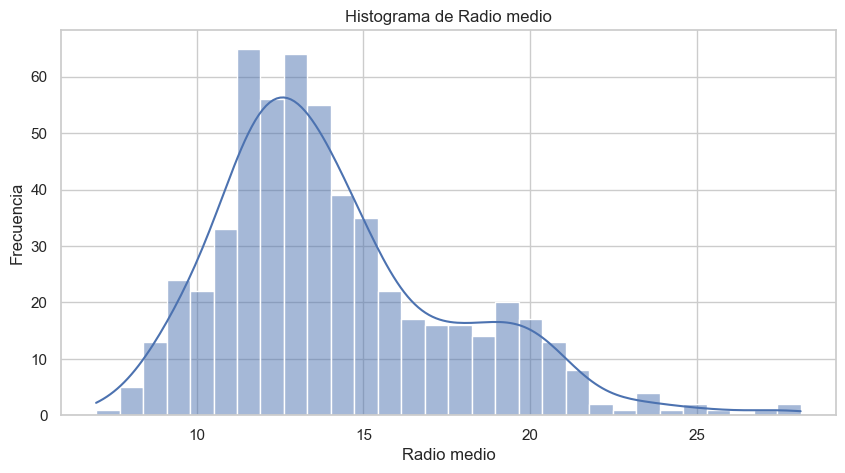

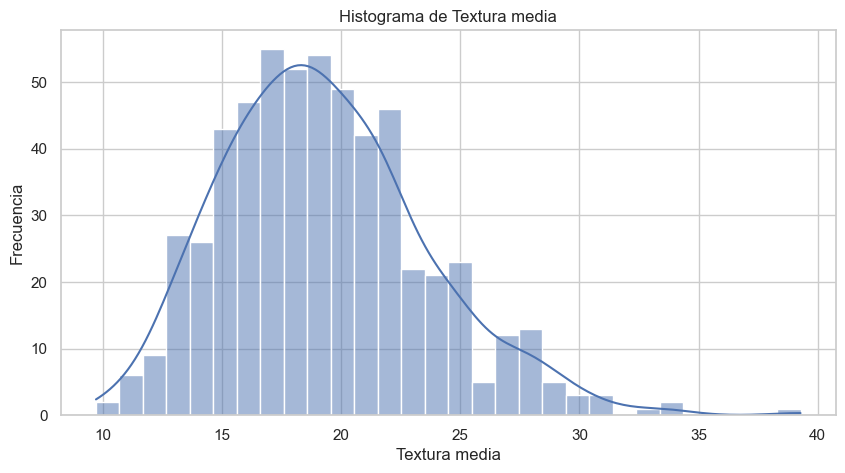

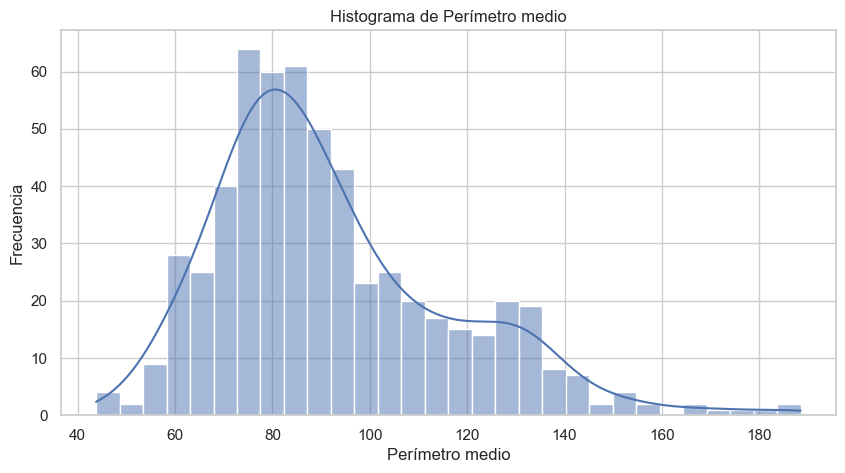

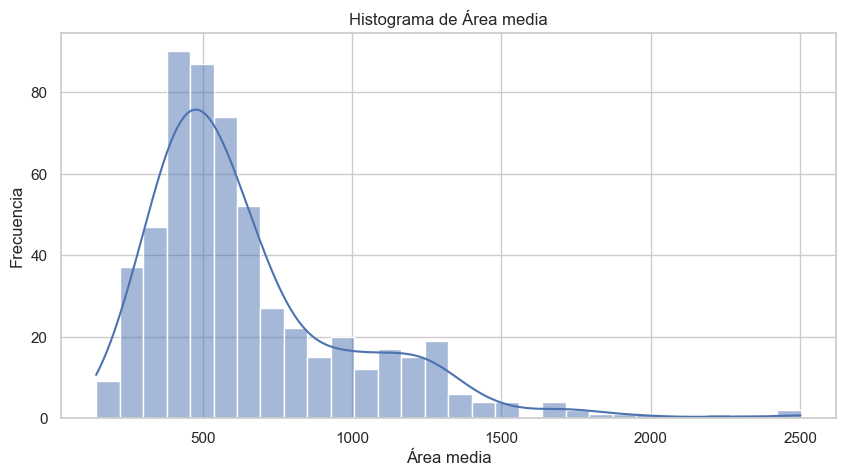

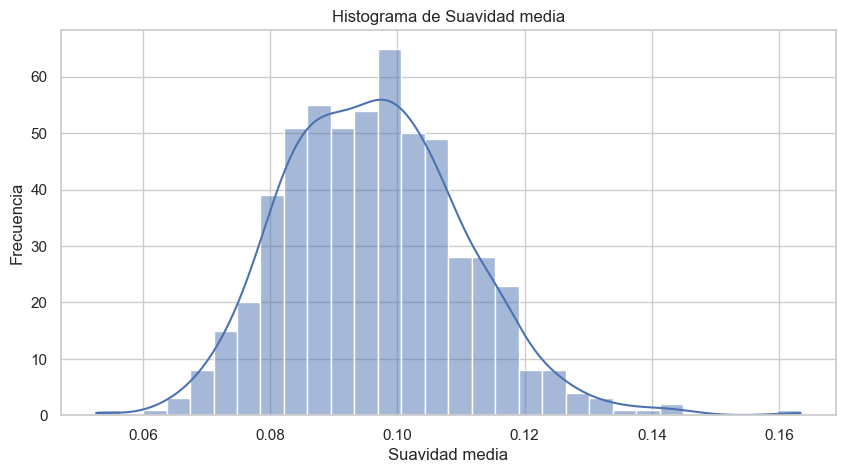

...

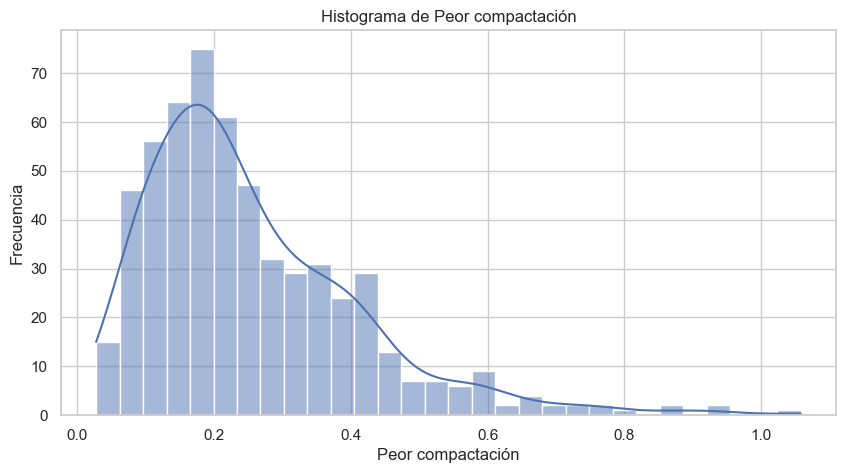

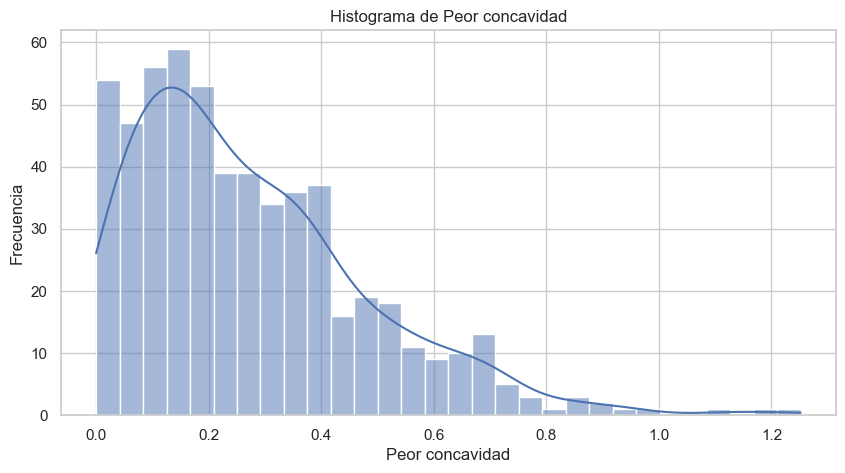

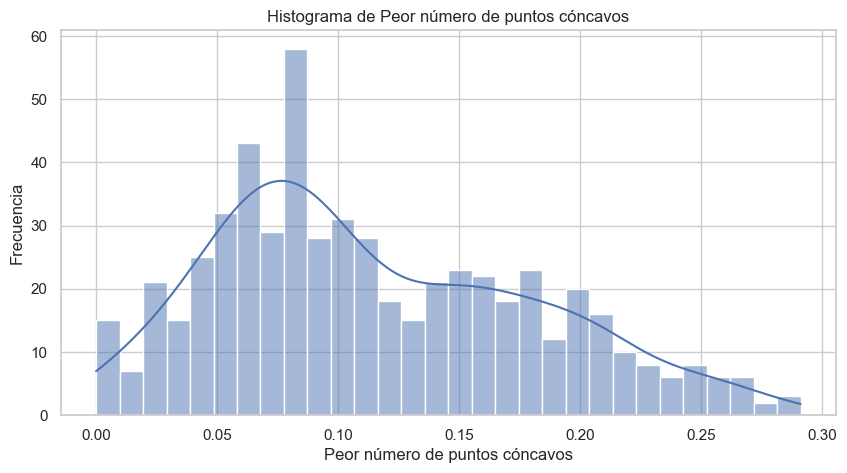

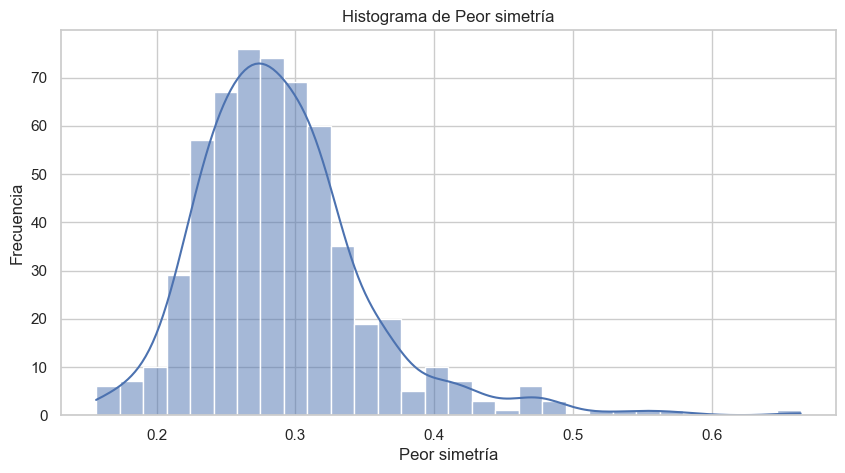

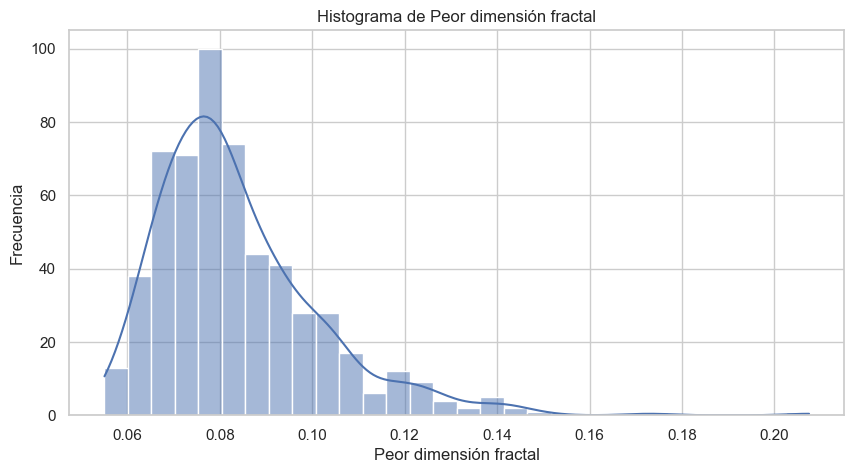

In [326]:
# Crear histograma para cada variable
for feature in num_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[feature], bins=30, kde=True)
    plt.title(f'Histograma de {features_esn[feature]}')
    plt.xlabel(features_esn[feature])
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()

In [327]:
palette = {
    0: '#ff9999',  # Rojo
    1: '#99ff99'   # Verde
}

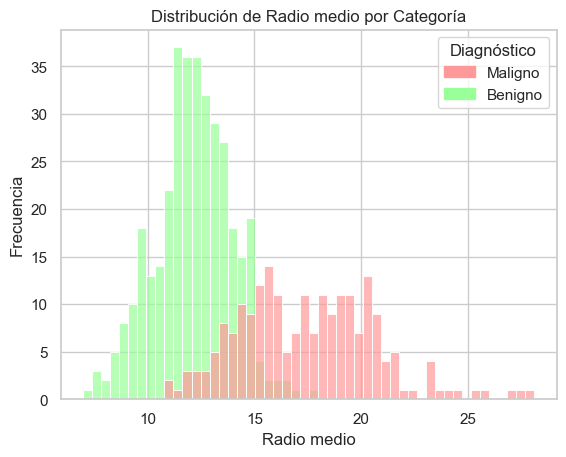

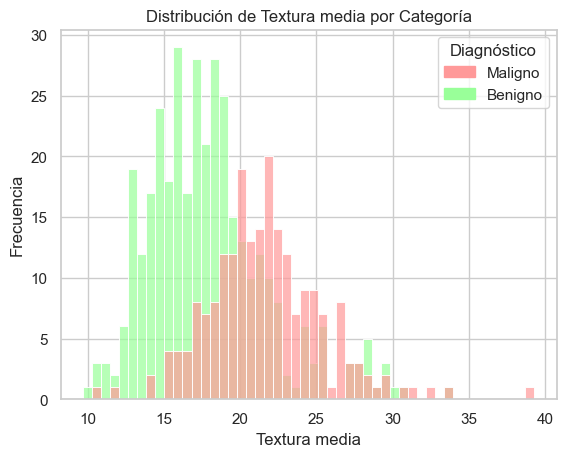

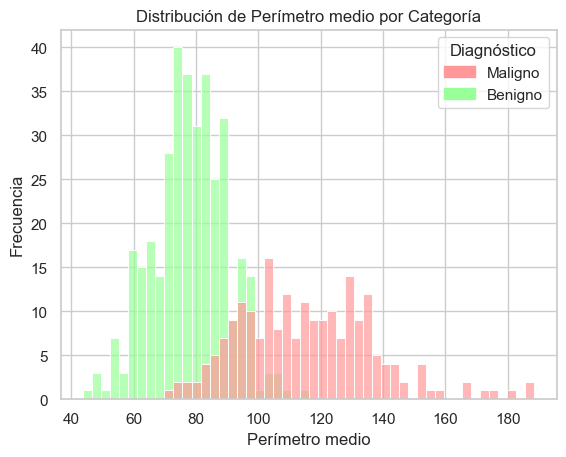

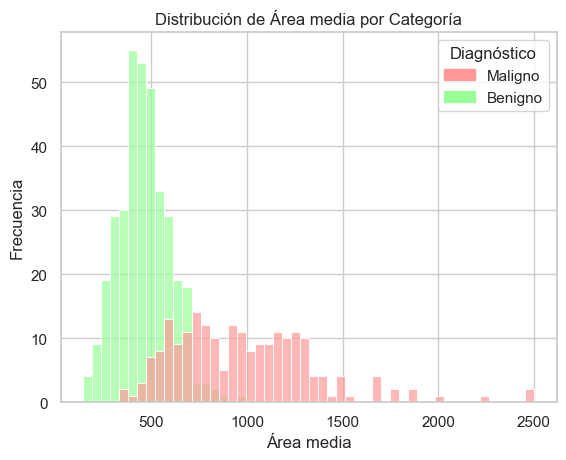

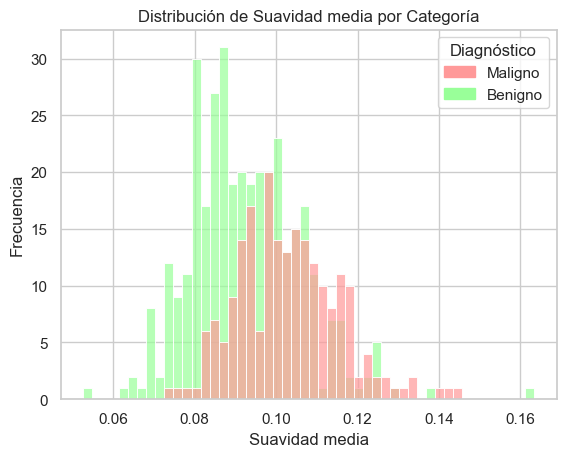

...

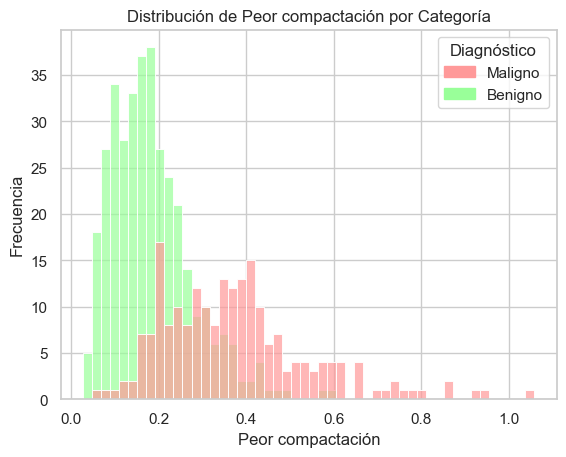

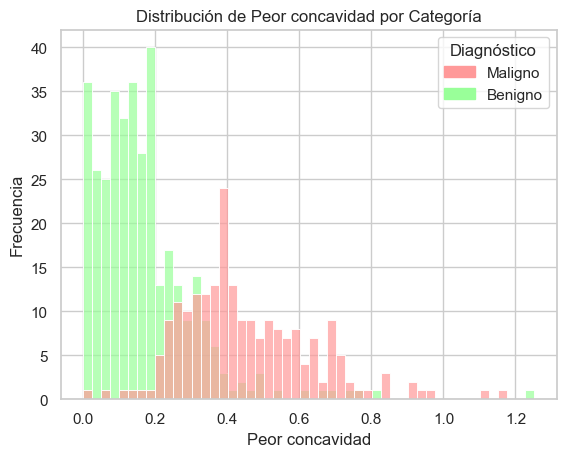

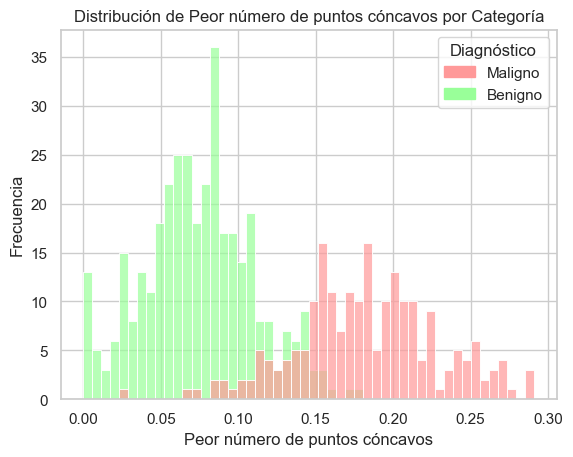

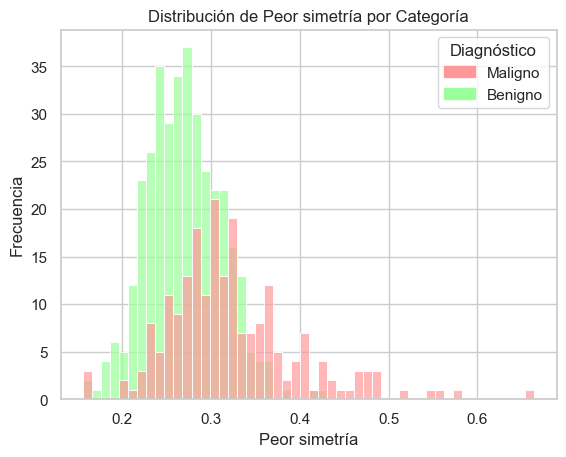

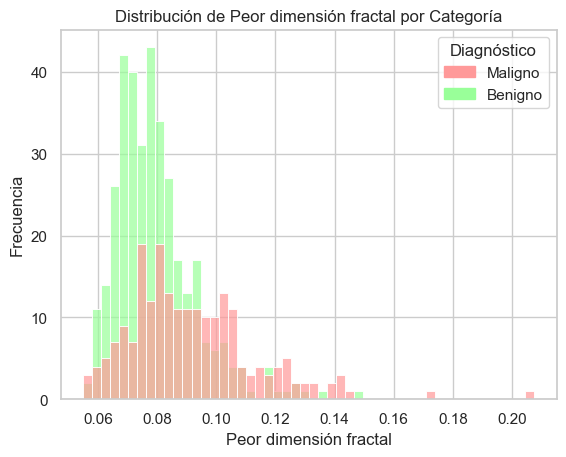

In [328]:
# Crear histogramas para cada variable según target
for feature in num_columns:
    sns.histplot(data=df, x=feature, hue='target', bins=50, alpha=0.7, palette=palette)
    plt.xlabel(features_esn[feature])
    plt.ylabel('Frecuencia')
    plt.title(f'Distribución de {features_esn[feature]} por Categoría')

    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, title='Diagnóstico')
    
    plt.show()

### Distribución de categorías

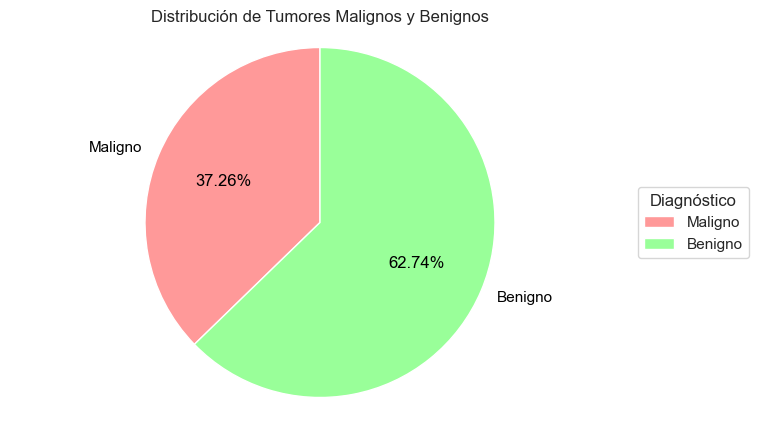

In [329]:

# Contar las instancias de cada clase y asegurarse de que el orden sea correcto (maligno primero)
class_counts = df['target'].value_counts().sort_index()

# Obtener las etiquetas textuales ('maligno' y 'benigno') en el orden correcto
labels = [target_esn[idx] for idx in class_counts.index]

# Definir los colores en el orden correcto (rojo para 'maligno', verde para 'benigno')
colors = ['#ff9999', '#99ff99']  # Rojo para 'maligno' y verde para 'benigno'

# Crear el gráfico de pastel
plt.figure(figsize=(8, 5))
plt.pie(class_counts, labels=labels, autopct='%1.2f%%', colors=colors, startangle=90, textprops={'color': 'black'})
plt.title('Distribución de Tumores Malignos y Benignos')
plt.axis('equal')  # Igualar el aspecto del gráfico para que sea un círculo

# Añadir la leyenda con los colores correctos
plt.legend(labels=labels, title='Diagnóstico', loc='center left', bbox_to_anchor=(1, 0.5))

# Mostrar el gráfico
plt.show()




### Correlación entre atributos

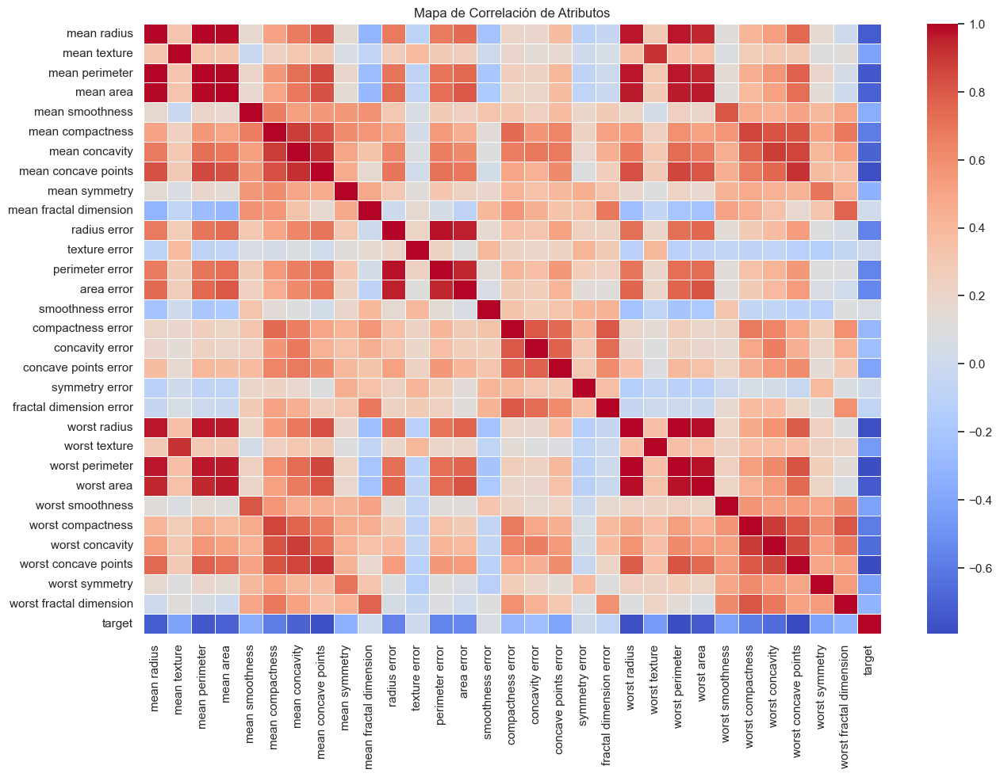

In [330]:
plt.figure(figsize=(15, 10))
correlation = df.corr()
sns.heatmap(correlation, annot=False, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Mapa de Correlación de Atributos')
plt.show()

#### Pregunta:  - ¿Cómo se distribuyen las características para tumores benignos vs. malignos?. ¿Existen diferencias significativas en las distribuciones de estas características entre los dos tipos de diagnóstico?


**Respuesta:**
* Se observó que en el caso de tumores benignos la media y desvío estándar de las características son menores que en el caso de los malignos. 
* En el caso de la media el resultado es esperable dado que tumores con valores medios de radio_worst (o radio_mean) o concave_points_worst (entre otros) mayores tiende a ser un diagnóstico de tumor maligno. 
* Además, en todos los casos ambas distribuciones (maligno/beningo) se encuentran separadas (si bien existe zona de superposción) permitiendo definir rangos empíricos de diagnóstico. 



In [331]:
# Correlación de cada atributo con el target
correlation_with_target = correlation['target'].sort_values(ascending=False)
print(correlation_with_target)

target                     1.000000
smoothness error           0.067016
mean fractal dimension     0.012838
texture error              0.008303
symmetry error             0.006522
fractal dimension error   -0.077972
concavity error           -0.253730
compactness error         -0.292999
worst fractal dimension   -0.323872
mean symmetry             -0.330499
mean smoothness           -0.358560
concave points error      -0.408042
mean texture              -0.415185
worst symmetry            -0.416294
worst smoothness          -0.421465
worst texture             -0.456903
area error                -0.548236
perimeter error           -0.556141
radius error              -0.567134
worst compactness         -0.590998
mean compactness          -0.596534
worst concavity           -0.659610
mean concavity            -0.696360
mean area                 -0.708984
mean radius               -0.730029
worst area                -0.733825
mean perimeter            -0.742636
worst radius              -0

In [332]:
# Umbral asumido => Máxima correlación entre atributos
threshold = 0.7

# Pares de atributos con correlación alta (> 0.7 o < -0.7)
high_correlation_pairs = (correlation.abs() > 0.7) & (correlation != 1.0)
high_correlation_attrs = correlation[high_correlation_pairs]

pairs = set()
for i in high_correlation_attrs.index:
    for j in high_correlation_attrs.columns:
        if pd.notna(high_correlation_attrs.loc[i, j]):
            index = tuple(sorted([i, j]))
            pairs.add((*index, high_correlation_attrs.loc[i, j]))

for k in pairs:
    print(f"{k[0]} - {k[1]} : {k[2]}")

radius error - worst radius : 0.715065195135185
area error - worst perimeter : 0.7612126360687592
area error - worst area : 0.8114079609317274
mean concavity - worst compactness : 0.7549680159063962
target - worst area : -0.7338250349210507
mean area - perimeter error : 0.7266283277906844
target - worst radius : -0.77645377859504
compactness error - fractal dimension error : 0.8032688176617679
concavity error - fractal dimension error : 0.727372183881192
mean concave points - mean radius : 0.8225285223871786
mean area - worst concave points : 0.7220166262603579
worst area - worst radius : 0.9840145644590742
perimeter error - radius error : 0.9727936770160764
concave points error - concavity error : 0.7718039949238469
mean concave points - mean perimeter : 0.8509770412528191
area error - mean perimeter : 0.7449826941190683
mean area - mean radius : 0.9873571700566127
mean area - mean perimeter : 0.9865068039913907
compactness error - mean compactness : 0.7387217896603929
worst concave p

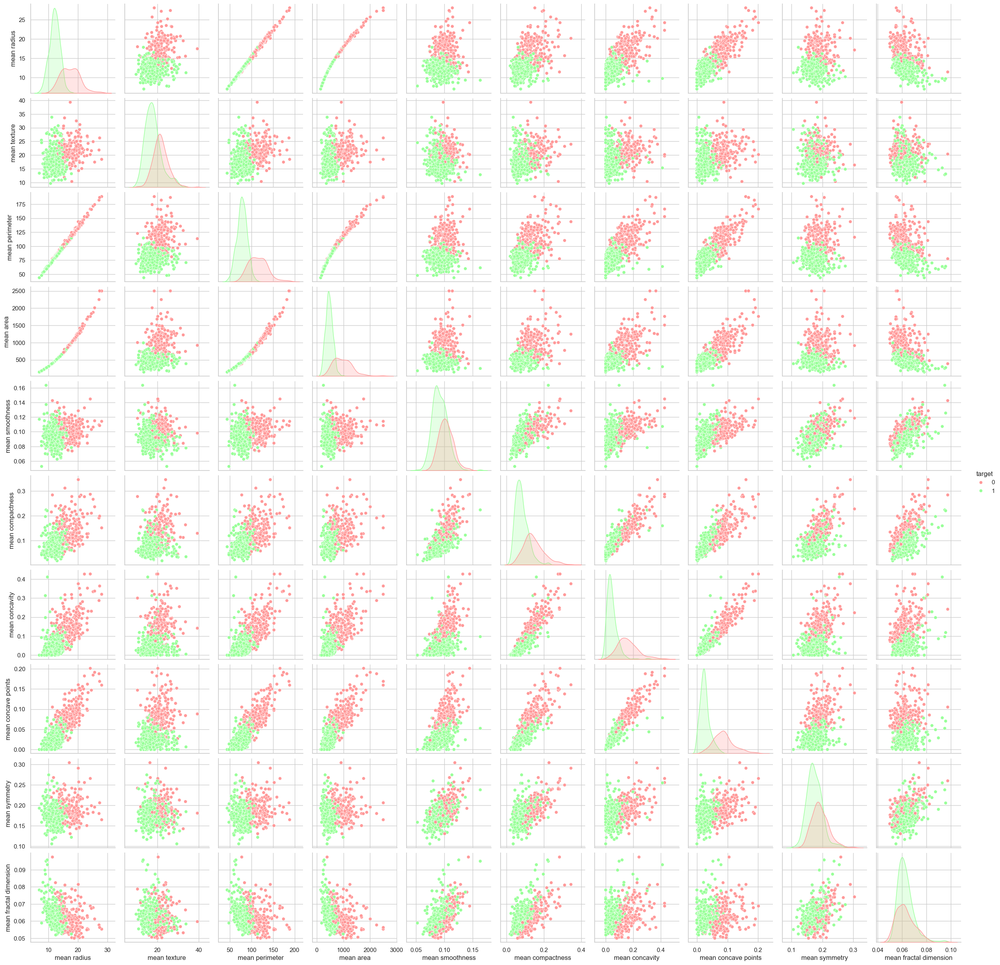

In [333]:
df_mean = df.filter(regex='mean|target')
sns.pairplot(data=df_mean, diag_kind="kde", hue='target', palette=palette);

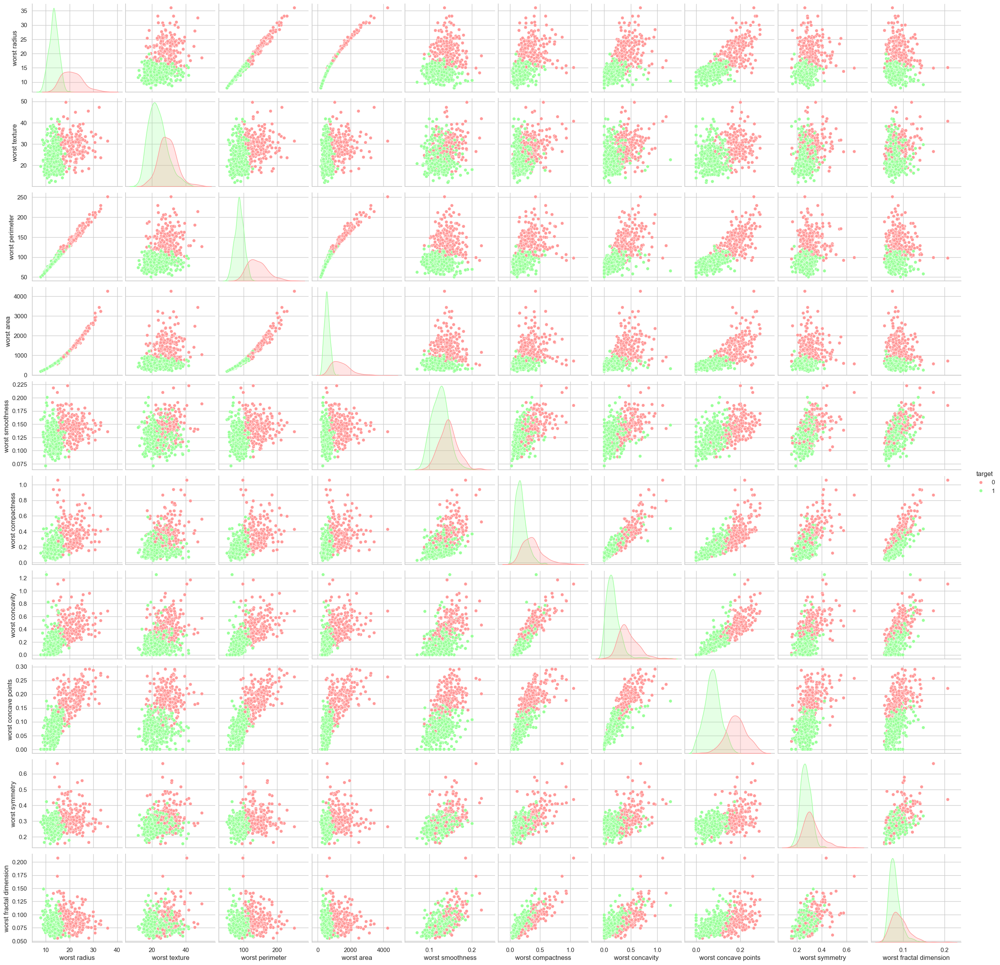

In [334]:
df_worst = df.filter(regex='worst|target')
sns.pairplot(data=df_worst, diag_kind="kde", hue='target', palette=palette);

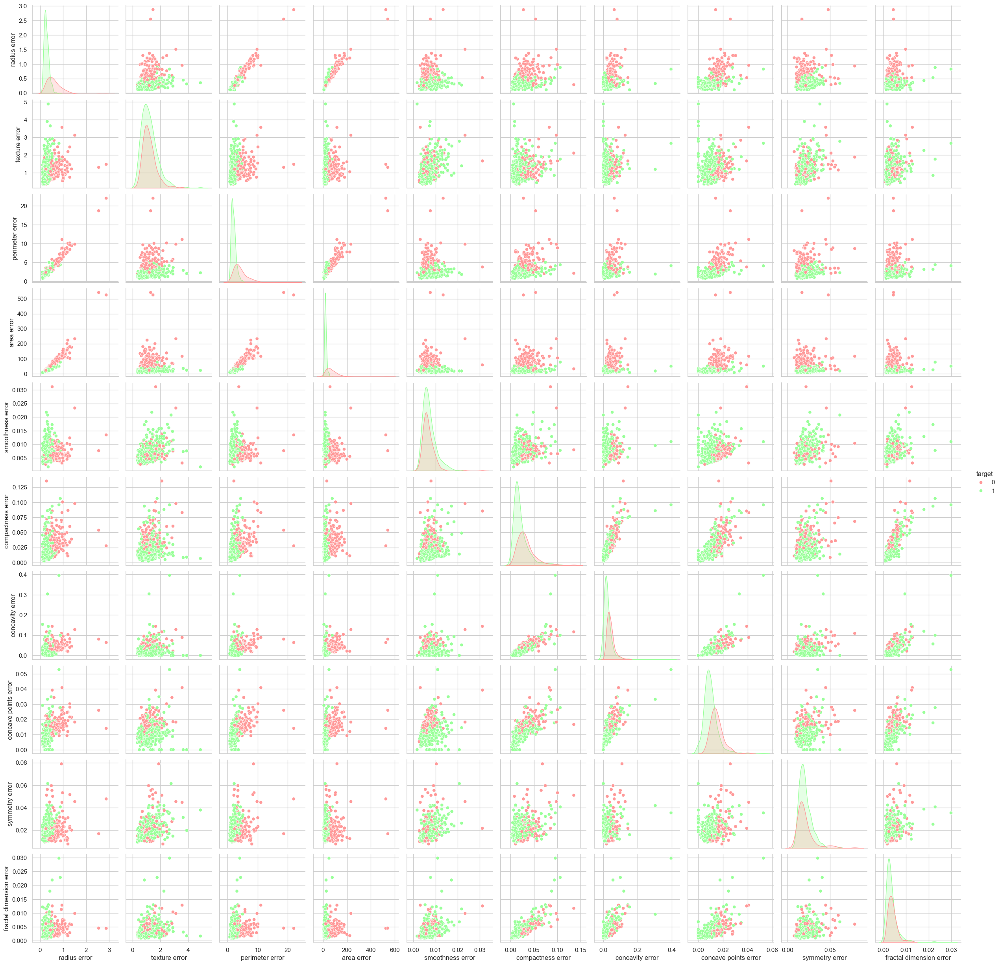

In [335]:
df_error = df.filter(regex='error|target')
sns.pairplot(data=df_error, diag_kind="kde", hue='target', palette=palette);

## Boxplot

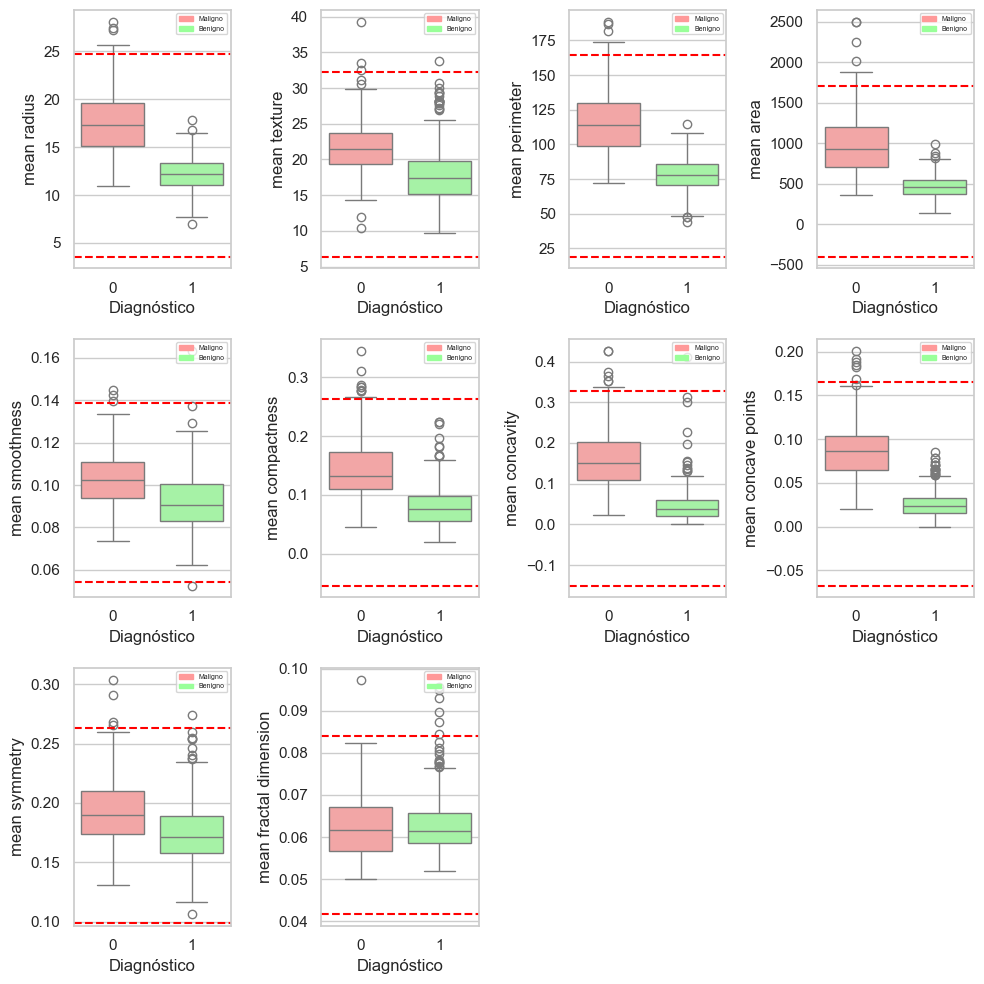

In [336]:


# Crear un ejemplo de paleta de colores y diccionario de características 
palette = ['#ff9999', '#99ff99']
features_esn = {feature: feature for feature in df_mean.drop(columns='target').columns}  # Asumir que el nombre es igual al feature

plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_mean.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)
    
    # Datos de la característica actual
    feature_data = df[feature]
    
    # Calcular la media y la desviación estándar para la característica
    mean = feature_data.mean()
    std_dev = feature_data.std()
    
    # Calcular los límites de los bigotes del boxplot
    Q1 = feature_data.quantile(0.25)
    Q3 = feature_data.quantile(0.75)
    IQR = Q3 - Q1
    
    # Crear el gráfico de cajas
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    
    # Añadir líneas punteadas para 3 desviaciones estándar arriba y abajo de la media
    plt.axhline(y=mean + 3 * std_dev, color='red', linestyle='--')
    plt.axhline(y=mean - 3 * std_dev, color='red', linestyle='--')
    
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    
    # Crear la leyenda
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()


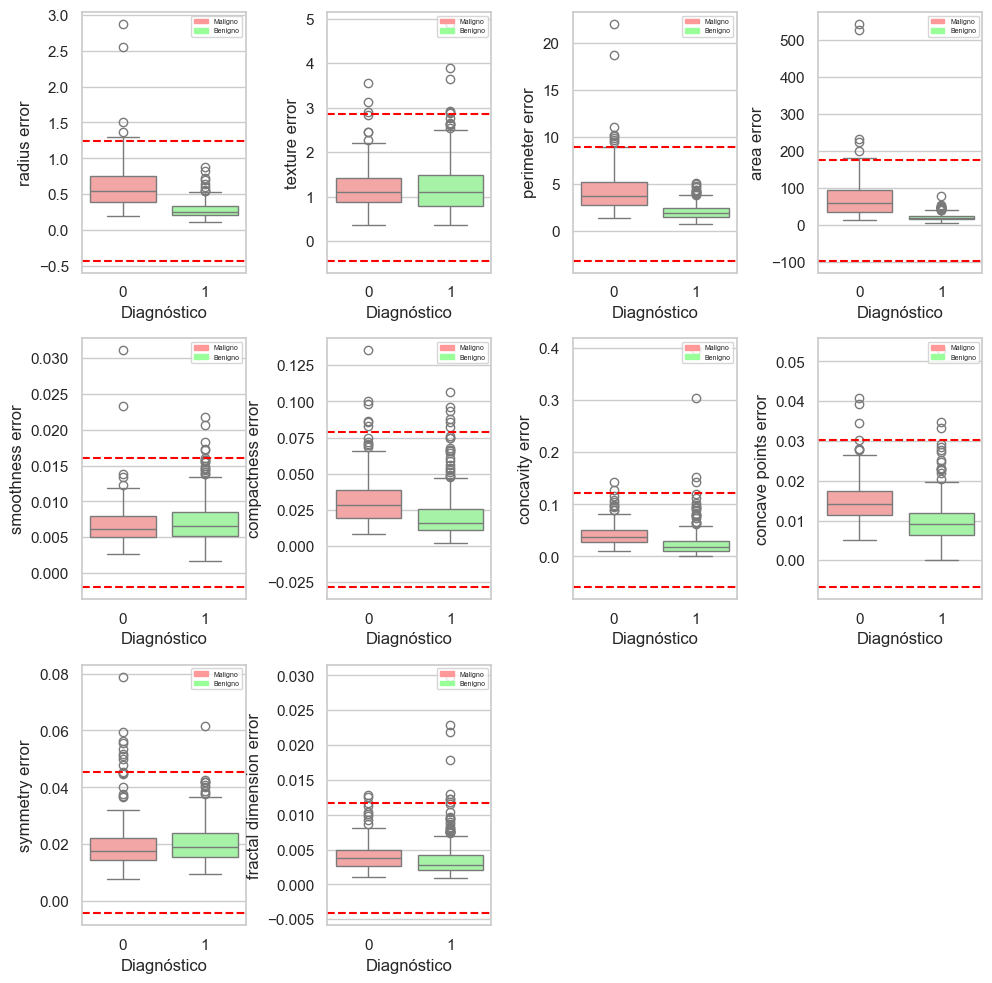

In [337]:


# Crear un ejemplo de paleta de colores 
palette = ['#ff9999', '#99ff99']
features_esn = {feature: feature for feature in df_error.drop(columns='target').columns}  # Asumir que el nombre es igual al feature

plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_error.drop(columns='target')):
    plt.subplot(len(df_error.columns) // 4 + 1, 4, i + 1)  
    
    # Datos de la característica actual
    feature_data = df[feature]
    
    # Calcular la media y la desviación estándar para la característica
    mean = feature_data.mean()
    std_dev = feature_data.std()
    
    # Crear el gráfico de cajas
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    
    # Añadir líneas punteadas para 3 desviaciones estándar arriba y abajo de la media
    plt.axhline(y=mean + 3 * std_dev, color='red', linestyle='--')
    plt.axhline(y=mean - 3 * std_dev, color='red', linestyle='--')
    
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    
    # Crear la leyenda
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()


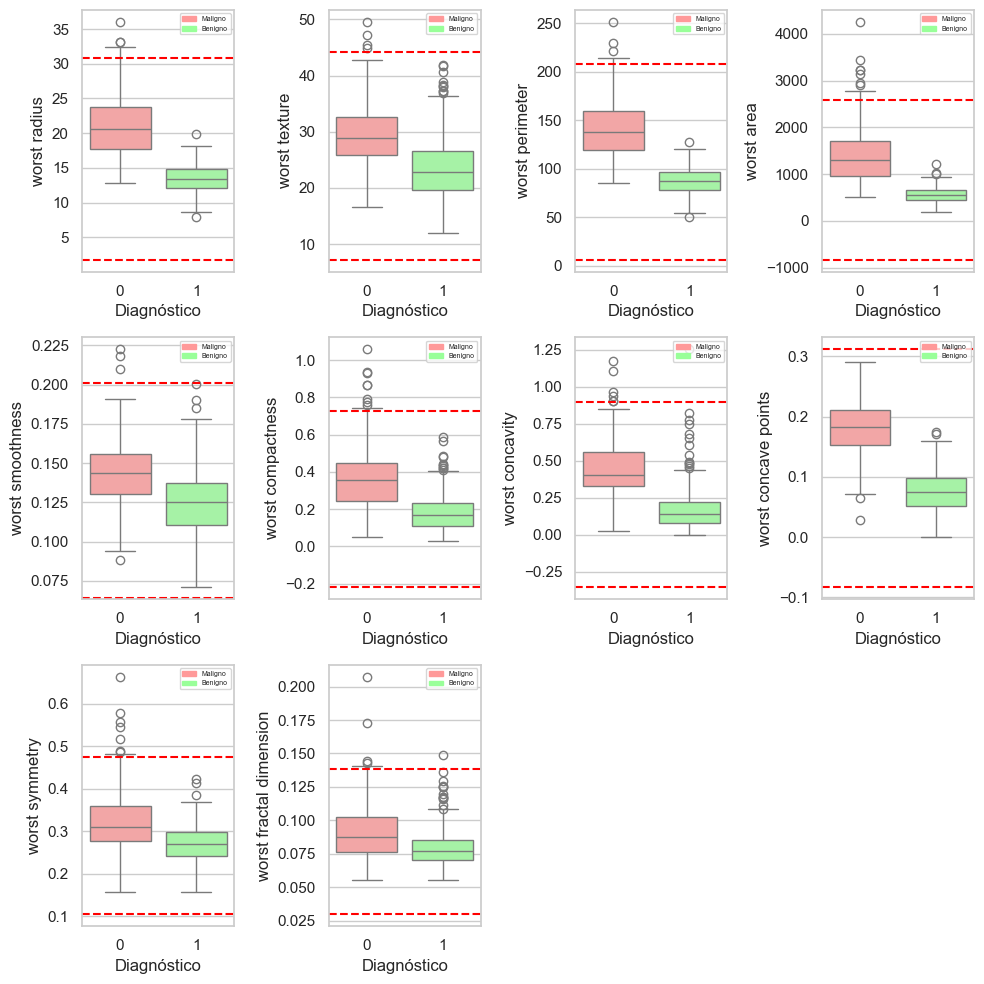

In [338]:


# Crear un ejemplo de paleta de colores 
palette = ['#ff9999', '#99ff99']
features_esn = {feature: feature for feature in df_worst.drop(columns='target').columns}  # Asumir que el nombre es igual al feature

plt.figure(figsize=(10, 10))

for i, feature in enumerate(df_worst.drop(columns='target')):
    plt.subplot(10 // 4 + 1, 4, i + 1)  
    
    # Datos de la característica actual
    feature_data = df[feature]
    
    # Calcular la media y la desviación estándar para la característica
    mean = feature_data.mean()
    std_dev = feature_data.std()
    
    # Crear el gráfico de cajas
    sns.boxplot(data=df, x='target', y=feature, palette=palette, hue='target')
    
    # Añadir líneas punteadas para 3 desviaciones estándar arriba y abajo de la media
    plt.axhline(y=mean + 3 * std_dev, color='red', linestyle='--')
    plt.axhline(y=mean - 3 * std_dev, color='red', linestyle='--')
    
    plt.xlabel('Diagnóstico')
    plt.ylabel(features_esn[feature])
    
    # Crear la leyenda solo para los colores de 'Maligno' y 'Benigno'
    handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
    plt.legend(handles=handles, fontsize='5', loc='upper right')

plt.tight_layout()
plt.show()


### Bubble plots

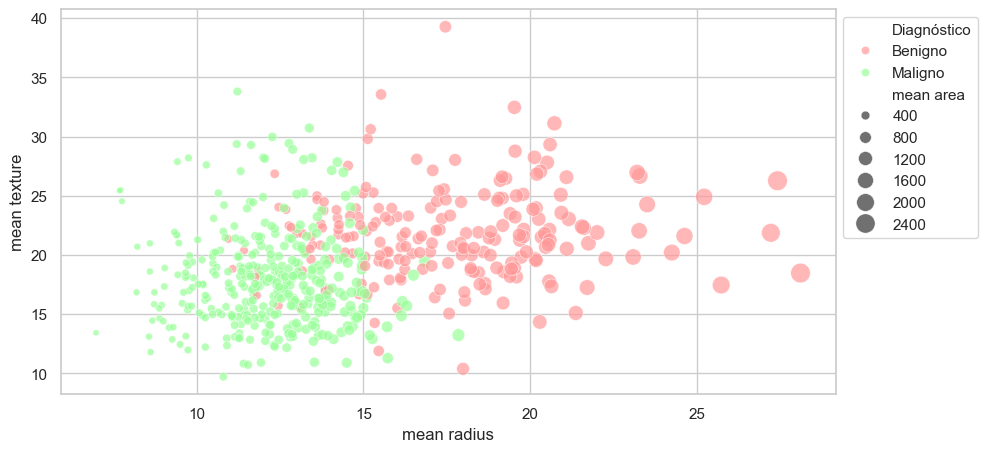

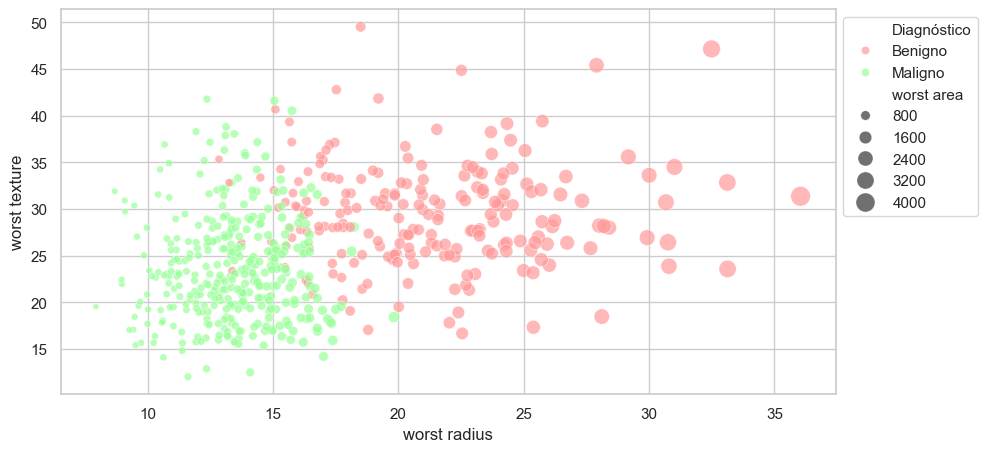

In [339]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un ejemplo de paleta de colores y diccionario de características 
palette = ['#ff9999', '#99ff99']
features_esn = {feature: feature for feature in df.columns if feature != 'target'}  # Asumir que el nombre es igual al feature
target_esn = {0: 'Benigno', 1: 'Maligno'}  # Ejemplo de mapeo para 'target'

# Características para comparar en el bubble plot
bubble_plots = [
    ['mean radius', 'mean texture', 'mean area'],
    ['worst radius', 'worst texture', 'worst area']
]

for i in bubble_plots:
    x_feature = i[0]
    y_feature = i[1]
    size_feature = i[2]

    plt.figure(figsize=(10, 5))
    bubble_plot = sns.scatterplot(
        data=df,
        x=x_feature,
        y=y_feature,
        size=size_feature,
        hue='target',
        palette=palette,
        sizes=(20, 200),  # Ajusta el rango de tamaños de burbujas
        alpha=0.7
    )
    
    plt.xlabel(features_esn[x_feature])
    plt.ylabel(features_esn[y_feature])

    handles, labels = bubble_plot.get_legend_handles_labels()

    for i, label in enumerate(labels):
        if label == 'target':
            labels[i] = 'Diagnóstico'
        elif label in features_esn:
            labels[i] = features_esn[label]
        elif int(label) in target_esn:
            labels[i] = target_esn[int(label)]
        else:
            labels[i] = label

    bubble_plot.legend(
        handles=handles,
        labels=labels,
        loc='upper left',
        bbox_to_anchor=(1, 1),
        title_fontsize='13',
        fontsize='11'
    )

    plt.show()

    plt.show()



### Joint Plot

Combina un gráfico de dispersión con histogramas marginales para facilitar la visualización de la relación entre dos variables continuas.

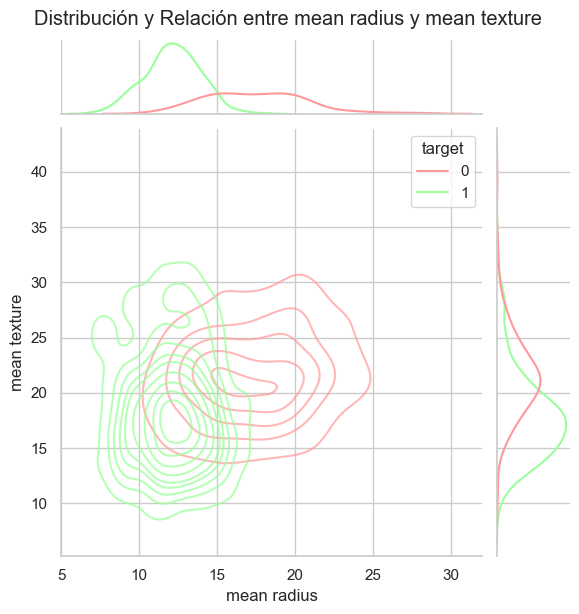

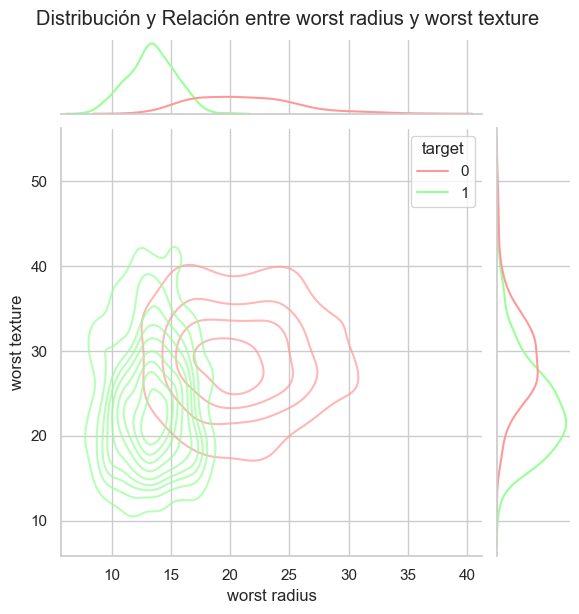

In [340]:
j_plot = [
    ['mean radius', 'mean texture'],
    ['worst radius', 'worst texture']
]

for i in j_plot:
    sns.jointplot(data=df, x=df[i[0]], y=df[i[1]], hue='target', palette=palette, alpha=0.7, kind='kde')
    plt.suptitle(f'Distribución y Relación entre {features_esn[i[0]]} y {features_esn[i[1]]}', y=1.02)
    plt.xlabel(features_esn[i[0]])
    plt.ylabel(features_esn[i[1]])
    plt.show()

### Selección de características

In [341]:
# Entrenar el modelo Decision Tree
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [342]:
# Predecir y evaluar el modelo con todas las características
y_pred_all_features = model.predict(X_test)
accuracy_all_features = accuracy_score(y_test, y_pred_all_features)
print(f'Precisión con todas las características: {accuracy_all_features:.2f}')

Precisión con todas las características: 0.94


In [343]:
# Obtener la importancia de las características
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns, 
    'Importance': importances}).sort_values(by='Importance', ascending=False)

# Mostrar la importancia de las características
print("Importancia de las características:")
print(feature_importance_df)

Importancia de las características:
                    Feature  Importance
7       mean concave points    0.705839
21            worst texture    0.114062
20             worst radius    0.070187
23               worst area    0.036653
1              mean texture    0.022885
17     concave points error    0.017164
13               area error    0.013563
24         worst smoothness    0.010492
16          concavity error    0.007152
14         smoothness error    0.002004
19  fractal dimension error    0.000000
0               mean radius    0.000000
18           symmetry error    0.000000
25        worst compactness    0.000000
26          worst concavity    0.000000
27     worst concave points    0.000000
28           worst symmetry    0.000000
22          worst perimeter    0.000000
15        compactness error    0.000000
12          perimeter error    0.000000
11            texture error    0.000000
10             radius error    0.000000
9    mean fractal dimension    0.000000
8   

In [344]:
# Seleccionar las características más importantes
selector = SelectFromModel(model, prefit=True, threshold=0.01)
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

# Mostrar las características seleccionadas
selected_features = X.columns[selector.get_support()]
print("Características seleccionadas:")
print(selected_features)

Características seleccionadas:
Index(['mean texture', 'mean concave points', 'area error',
       'concave points error', 'worst radius', 'worst texture', 'worst area',
       'worst smoothness'],
      dtype='object')


c:\Users\SHIFTA-0164\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(
c:\Users\SHIFTA-0164\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [345]:
# Entrenar el modelo Decision Tree con las características seleccionadas
model_selected = DecisionTreeClassifier(random_state=42)
model_selected.fit(X_train_selected, y_train)

# Predecir y evaluar el modelo con las características seleccionadas
y_pred_selected_features = model_selected.predict(X_test_selected)
accuracy_selected_features = accuracy_score(y_test, y_pred_selected_features)
print(f'Precisión con las características seleccionadas: {accuracy_selected_features:.2f}')


Precisión con las características seleccionadas: 0.95


In [346]:
print("Características seleccionadas:\n")
for item in selected_features:
    print(features_esn[item])

Características seleccionadas:

mean texture
mean concave points
area error
concave points error
worst radius
worst texture
worst area
worst smoothness


## Desarrollo de modelos

### Regresión Logística

In [347]:
def LogRegression (X_tr, y_tr, X_ts, y_ts):
    lregression = LogisticRegression(random_state = 42, class_weight="balanced")
    lregression.fit(X_tr, y_tr)

    y_pred_lr = lregression.predict(X_ts)

    ## Matriz de confusión
    cm_lr = confusion_matrix(y_ts, y_pred_lr)
    
    g_cm_lr = ConfusionMatrixDisplay(confusion_matrix=cm_lr, display_labels=lregression.classes_)
    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [1, 1]})
    
    ax0.axvline(x=0.5, color='gray', linestyle='--')
    ax0.axhline(y=0.5, color='gray', linestyle='--')
    ax0.text(0.25, 0.75, 'VERDADEROS\nNEGATIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.75, 0.75, 'FALSOS\nPOSITIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.25, 0.25, 'FALSOS\nNEGATIVOS', fontsize=12, ha='center', va='center')
    ax0.text(0.75, 0.25, 'VERDADEROS\nPOSITIVOS', fontsize=12, ha='center', va='center')
    ax0.set_xlim(0, 1)
    ax0.set_ylim(0, 1)
    ax0.axis('off')
    
    g_cm_lr.plot(ax=ax1, cmap='Greens')
    ax1.set_title("REGRESIÓN LOGÍSTICA")
    ax1.set_xlabel('Predicción') 
    ax1.set_ylabel('Valor verdadero') 
    
    plt.tight_layout()
    plt.show()

    metrics_data = [
    [f"{round(accuracy_score(y_ts, y_pred_lr)*100, 2)}%"],
    [round(precision_score(y_ts, y_pred_lr, zero_division=0), 4)],    
    [round(recall_score(y_ts, y_pred_lr, zero_division=0), 4)]
    ]
    
    metrics = pd.DataFrame(metrics_data, 
                           columns=['REGRESION LOGISTICA'], 
                           index=['Accuracy', 'Precision', 'Recall'])
    
    display(metrics)

    y_probs_lr = lregression.predict_proba(X_ts)[:, -1]

    fp_lr, p_lr, thresholds_lr = roc_curve(y_ts, y_probs_lr)
    
    plt.figure(figsize=(5, 5))
    plt.plot(fp_lr, p_lr, color='green', label="Regresión Logística")
    plt.plot([0, 1], [0, 1], color='red', linestyle='--')
    plt.xlabel("Tasa de Falsos Positivos")
    plt.ylabel("Tasa de Verdaderos Positivos")
    plt.title('Curva ROC')
    plt.legend()
    plt.grid(True)
    plt.show()

    auc_lr = auc(fp_lr, p_lr)
    print(f"AUC Regresión Logística = {auc_lr}")
    # El área bajo la curva de ser cercana a 1

Dataset con datos sin escalar:

c:\Users\SHIFTA-0164\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


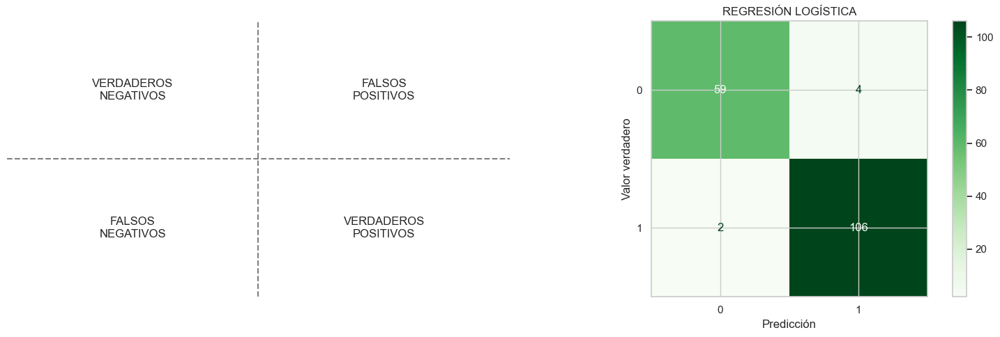

,REGRESION LOGISTICA
Accuracy,96.49%
Precision,0.9636
Recall,0.9815


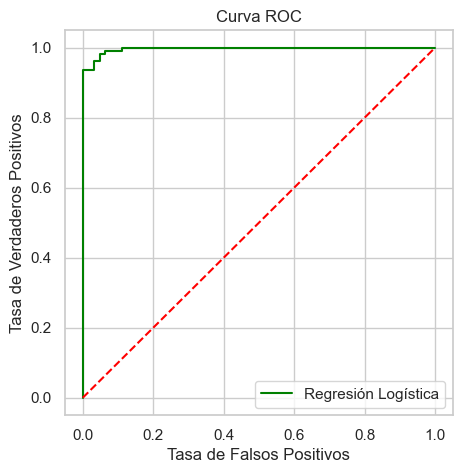

AUC Regresión Logística = 0.9966196355085244


In [348]:
print ("Dataset con datos sin escalar:")
LogRegression (X_train, y_train, X_test, y_test)


Datos escalados con StandardScaler


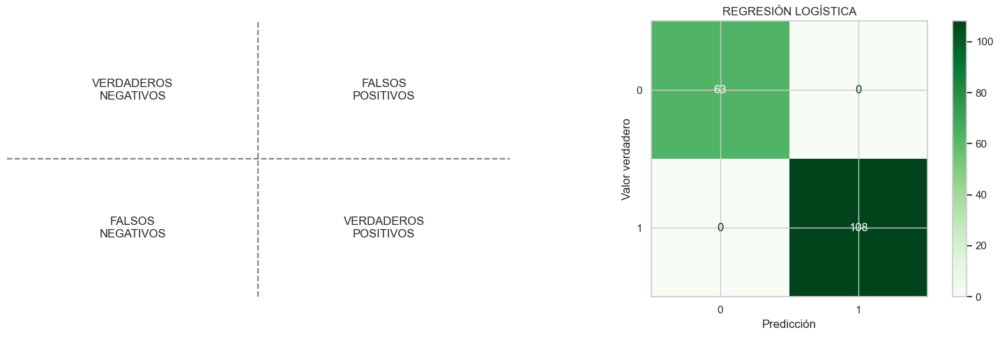

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


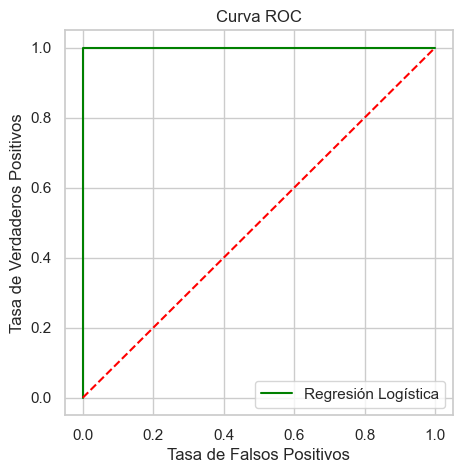

AUC Regresión Logística = 1.0

Datos escalados con MinMaxScaler


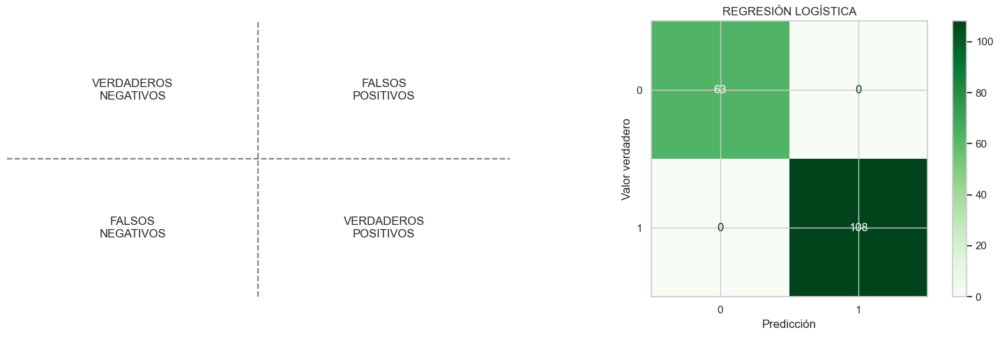

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


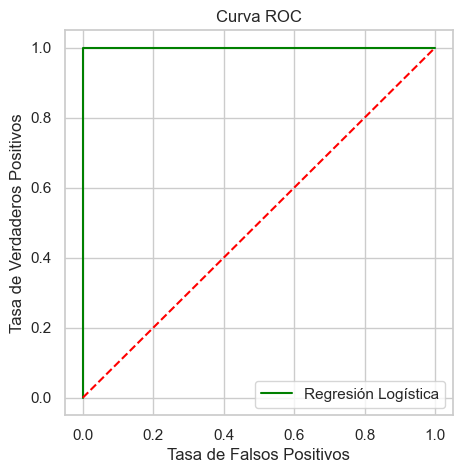

AUC Regresión Logística = 1.0

Datos escalados con RobustScaler


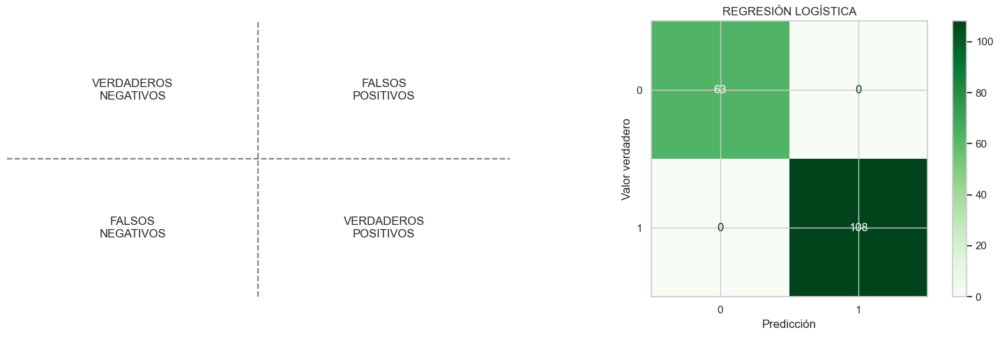

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


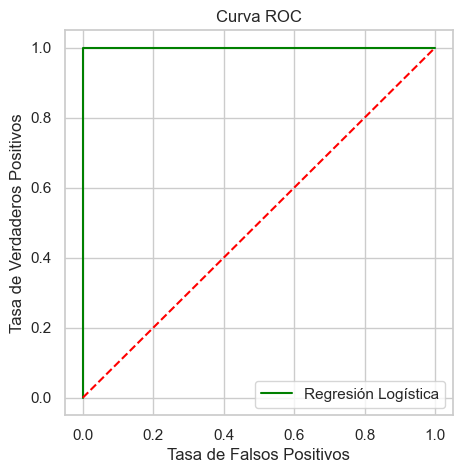

AUC Regresión Logística = 1.0

Datos escalados con Normalizer


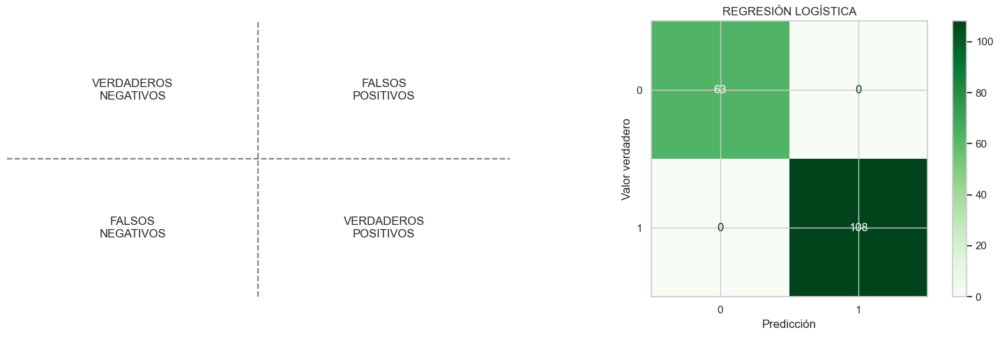

,REGRESION LOGISTICA
Accuracy,100.0%
Precision,1.0
Recall,1.0


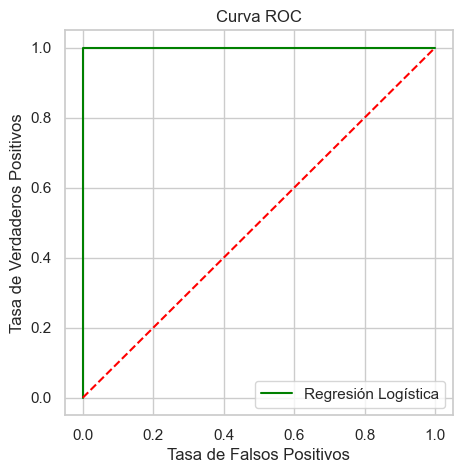

AUC Regresión Logística = 1.0


In [349]:
for i in scaled_df:
    print (f"\nDatos escalados con {i}")
    
    X_train_SS = scaled_df[i][0]
    X_test_SS = scaled_df[i][1]

    LogRegression (X_train_SS, y_train, X_test_SS, y_test)

### Regresión Logística con features seleccionadas

In [350]:
selected_columns = list(selected_features)
selected_columns.append('target')
print(selected_columns)

['mean texture', 'mean concave points', 'area error', 'concave points error', 'worst radius', 'worst texture', 'worst area', 'worst smoothness', 'target']


In [351]:
df_selected = df[selected_columns]
df_selected.head()

,mean texture,mean concave points,area error,concave points error,worst radius,worst texture,worst area,worst smoothness,target
0,10.38,0.14710,153.40,0.01587,25.38,17.33,2019.0,0.1622,0
1,17.77,0.07017,74.08,0.01340,24.99,23.41,1956.0,0.1238,0
2,21.25,0.12790,94.03,0.02058,23.57,25.53,1709.0,0.1444,0
3,20.38,0.10520,27.23,0.01867,14.91,26.50,567.7,0.2098,0
4,14.34,0.10430,94.44,0.01885,22.54,16.67,1575.0,0.1374,0


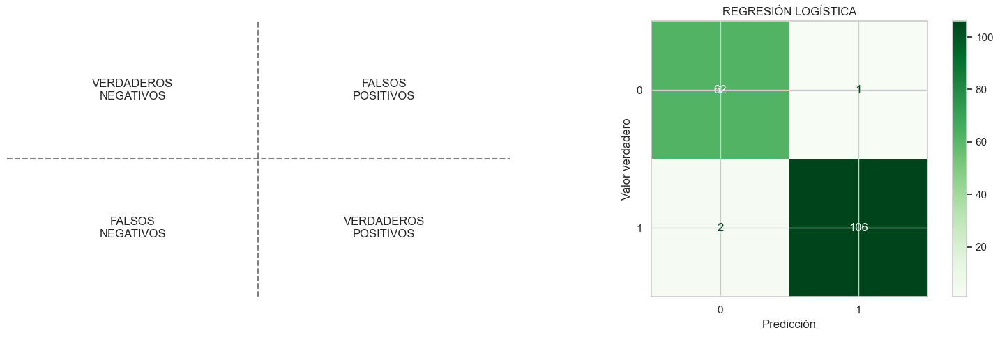

,REGRESION LOGISTICA
Accuracy,98.25%
Precision,0.9907
Recall,0.9815


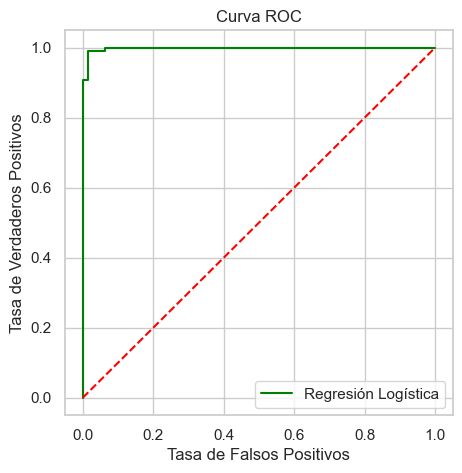

AUC Regresión Logística = 0.9980893592004703


In [352]:
X = df.drop('target', axis=1)
y = df['target']
# 70-30
X_train, X_test, y_train, y_test = train_test_split(X,  y, test_size=0.3, random_state=42)

# Escalamiento de datos
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_scaled = pd.DataFrame(X_train_scaled, columns=X.columns)
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X.columns)

LogRegression (X_train_scaled, y_train, X_test_scaled, y_test)

## Interpretación de resultados

In [353]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

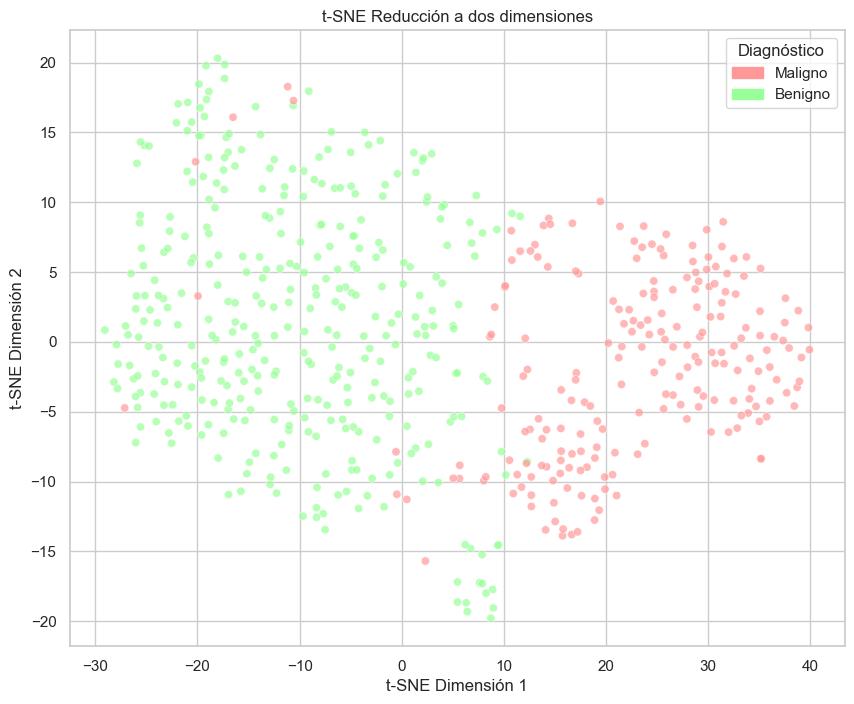

In [354]:
# Configurar y ajustar t-SNE para dos dimensiones
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2'])
df_tsne['target'] = y

sns.set(style="whitegrid")

plt.figure(figsize=(10, 8))
ax = sns.scatterplot(x='TSNE1', y='TSNE2', hue='target', data=df_tsne, palette=palette, alpha=0.7)
plt.title('t-SNE Reducción a dos dimensiones')
plt.xlabel('t-SNE Dimensión 1')
plt.ylabel('t-SNE Dimensión 2')
handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
plt.legend(handles=handles, title='Diagnóstico', loc='upper right')
plt.show()

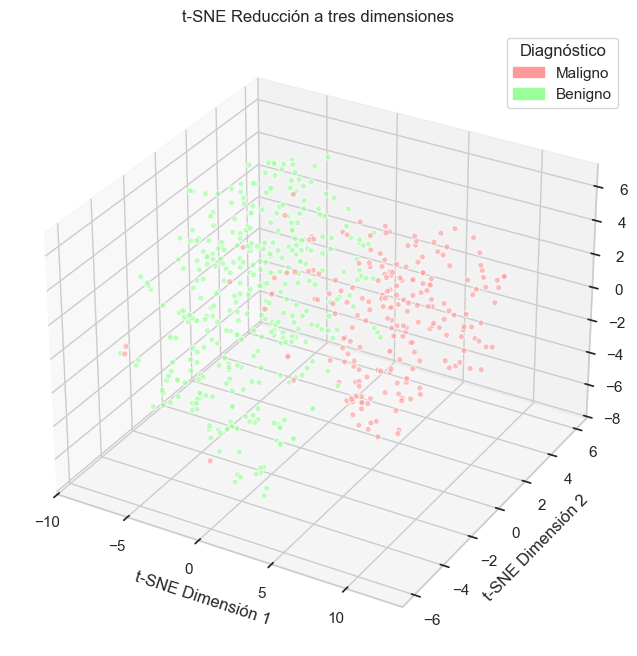

In [355]:
# Aplicar t-SNE para reducción a tres dimensiones
tsne = TSNE(n_components=3, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_tsne = pd.DataFrame(data=X_tsne, columns=['TSNE1', 'TSNE2', 'TSNE3'])
df_tsne['target'] = y

fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')


colors = [palette[label] for label in df_tsne['target']]
 
ax.scatter(df_tsne['TSNE1'], df_tsne['TSNE2'], df_tsne['TSNE3'], c=colors, alpha=0.6, edgecolors='w')

# Etiquetas y título
ax.set_xlabel('t-SNE Dimensión 1')
ax.set_ylabel('t-SNE Dimensión 2')
ax.set_zlabel('t-SNE Dimensión 3')
ax.set_title('t-SNE Reducción a tres dimensiones')
handles = [patches.Patch(color=palette[0], label='Maligno'), patches.Patch(color=palette[1], label='Benigno')]
plt.legend(handles=handles, title='Diagnóstico', loc='best')

plt.show()

### Validación Cruzada - KFold

In [356]:
# Crear el modelo
model = SVC(kernel='linear')

# Configurar la validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Evaluar el modelo usando validación cruzada
scores = cross_val_score(model, X_scaled, y, cv=skf)

print(f'Scores: {scores}')
print(f'Average Score: {scores.mean()}')

Scores: [0.99122807 0.94736842 0.95614035 0.99122807 0.99115044]
Average Score: 0.9754230709517155


### Recursive Feature Elimination

In [357]:
# Escalar las características
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

feature_names = X.columns

model = LogisticRegression(max_iter=10000)  # Sí o sí el modelo converge

for i in range(1, 32):
    rfe = RFE(estimator=model, n_features_to_select=i)

    rfe.fit(X_train_scaled, y_train)

    X_train_selected = rfe.transform(X_train_scaled)
    X_test_selected = rfe.transform(X_test_scaled)

    model.fit(X_train_selected, y_train)
    y_pred = model.predict(X_test_selected)
    accuracy = accuracy_score(y_test, y_pred)

    print(f'\nNúmero de características seleccionadas: {rfe.n_features_}')
    print(f'Características seleccionadas: {feature_names[rfe.support_]}')
    print(f'Precisión del modelo: {accuracy:.2f}')



Número de características seleccionadas: 1
Características seleccionadas: Index(['worst area'], dtype='object')
Precisión del modelo: 0.95

Número de características seleccionadas: 2
Características seleccionadas: Index(['worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.96

Número de características seleccionadas: 3
Características seleccionadas: Index(['worst radius', 'worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.96

Número de características seleccionadas: 4
Características seleccionadas: Index(['radius error', 'worst radius', 'worst area', 'worst concave points'], dtype='object')
Precisión del modelo: 0.95

Número de características seleccionadas: 5
Características seleccionadas: Index(['radius error', 'worst radius', 'worst texture', 'worst area',
       'worst concave points'],
      dtype='object')
Precisión del modelo: 0.97

Número de características seleccionadas: 6
Características seleccionadas: Index(['mean concav

c:\Users\SHIFTA-0164\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\feature_selection\_rfe.py:291: UserWarning: Found n_features_to_select=31 > n_features=30. There will be no feature selection and all features will be kept.
  warnings.warn(


### Selección Backward de características

In [358]:
# Importa las clases necesarias
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [359]:
# Divide en variables independientes (X) y dependientes (y)
X = df.drop('target', axis=1)
y = df['target']

In [360]:
# Establece el modelo de base
model = LogisticRegression(solver='liblinear')

In [361]:
# Aplica RFE (Recursive Feature Elimination) para seleccion de caracteristicas (implementa el método wrapper backward eliminando las características menos importantes)
rfe = RFE(model, n_features_to_select=5)  # Ajustar el número de características en 5
fit = rfe.fit(X, y)

In [362]:
# Evalua las caracteristicas seleccionadas
selected_features = X.columns[fit.support_]
print(f"Selected Features: {selected_features.tolist()}")

Selected Features: ['mean radius', 'mean concavity', 'worst radius', 'worst concavity', 'worst concave points']


In [363]:
# Para ver el ranking de todas las características
ranking = fit.ranking_
print(f"Feature Ranking: {dict(zip(X.columns, ranking))}")

Feature Ranking: {'mean radius': 1, 'mean texture': 11, 'mean perimeter': 13, 'mean area': 26, 'mean smoothness': 14, 'mean compactness': 19, 'mean concavity': 1, 'mean concave points': 2, 'mean symmetry': 8, 'mean fractal dimension': 23, 'radius error': 4, 'texture error': 9, 'perimeter error': 3, 'area error': 7, 'smoothness error': 24, 'compactness error': 15, 'concavity error': 16, 'concave points error': 21, 'symmetry error': 20, 'fractal dimension error': 25, 'worst radius': 1, 'worst texture': 10, 'worst perimeter': 5, 'worst area': 22, 'worst smoothness': 17, 'worst compactness': 6, 'worst concavity': 1, 'worst concave points': 1, 'worst symmetry': 18, 'worst fractal dimension': 12}


In [364]:
# Eliminacion de campos del dataframe
def reduccion(df, lista):
  """
  Elimina las columnas, dentro del rango
  indicado, del dataframe de entrada.

  :param:
  :df: DataFrame con los atributos.
  :lista: Columna a partir de la cual eliminar.
  """
  # Crear un nuevo DataFrame solo con las columnas seleccionadas
  df_red = df[lista]
  
  return df_red

In [365]:
df_red =  reduccion(df, ['target','mean radius', 'mean concavity', 'worst radius', 'worst concavity', 'worst concave points'])

### Modelos

Originalmente la variable objetivo 'target' es categórica dado que puede tomar valores 0 (maligno) o 1 (benigno). Esto permite encarar la aplicación de algoritmos de clasificación. No obstante, la creación de la variable 'dummy' 'diagnosis_M' permite aplicar algoritmos de regresión dado la naturaleza numérica del objetivo.

A partir de lo anterior, se decidió aplicar y comparar los resultados de los siguientes modelos:

Regresión Logística.

SVC.

Árbol de Clasificación.

Perceptrón.

El atributo (objetivo) categórico es:

Atributo |
:---: | 
`target`|         

Luego del análisis de datos y de la ingeniería de características, se obtuvo que las
características relevantes son :

Atributo |
:---: |
`radio_mean` |
`radio_worst` |    
`concavity_mean` |     
`concavity_worst`|
`concave_points_worst`|

In [366]:
# Importa split de datos, busqueda de hiper-parametros, estandarizacion y metricas
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

In [367]:
# Separa las caracteristicas y el objetivo
X = df.loc[:, ['mean radius', 'mean concavity', 'worst radius', 'worst concavity', 'worst concave points']].values
y = df.loc[:, "target"].values

In [368]:
# Divide los datos en conjunto de entrenamiento y prueba 80/20%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Regresión Logística

Mejores hiperparámetros: LogisticRegression(C=100, max_iter=1000)
Precision: 0.9767441860465116
Recall: 0.9767441860465116
F1 Score: 0.9767441860465116


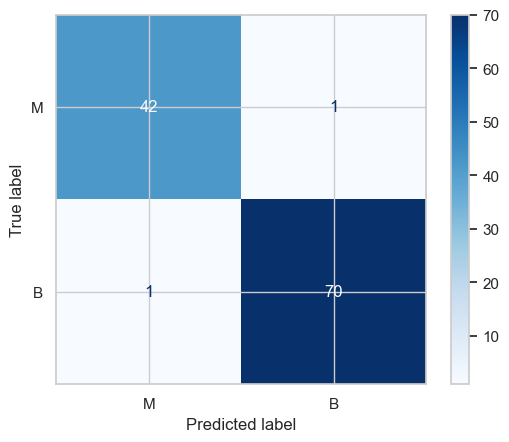

In [369]:
# Importa el algoritmo
from sklearn.linear_model import LogisticRegression

# Define la grilla de hiper-parametros
param_grid = {
    'C': [0.1, 1, 10, 100],  # Hiperparámetro para la regularización
    'solver': ['liblinear', 'lbfgs']  # Solvers para la optimización
}

# Asigna el modelo
model = LogisticRegression(max_iter=1000)

# Configura la busqueda de hiper-parametros por grilla con validacion cruzada
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Entrena el modelo
grid_search.fit(X_train, y_train)

# Obtiene el mejor modelo
best_model = grid_search.best_estimator_
print(f"Mejores hiperparámetros: {best_model}")

# Obtiene las metricas en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Calcula metricas
precision = precision_score(y_test, y_pred, pos_label=0)  # Asegúrate de que 'M' sea la etiqueta positiva
recall = recall_score(y_test, y_pred, pos_label=0)
f1 = f1_score(y_test, y_pred, pos_label=0)
conf_matrix = confusion_matrix(y_test, y_pred, labels=[0, 1])

# Muestra metricas
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

# Muestra matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['M', 'B'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Perceptrón

Mejores hiperparámetros: Perceptron(eta0=0.1, penalty='elasticnet')
Precision: 0.5584415584415584
Recall: 1.0
F1 Score: 0.7166666666666667


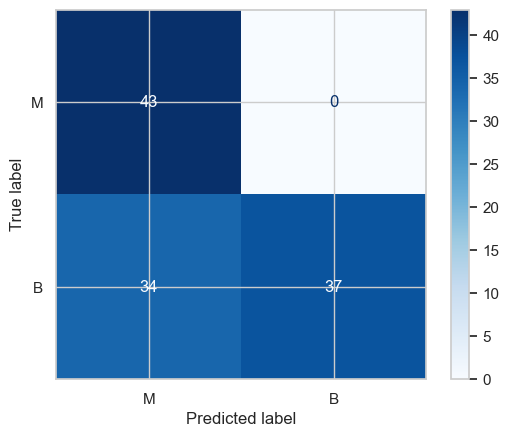

In [370]:
# Importa el algoritmo
from sklearn.linear_model import Perceptron

# Crea el modelo de perceptron
model = Perceptron()

# Define la grilla de hiper-parametros
param_grid = {
    'penalty': [None, 'l2', 'l1', 'elasticnet'],  # Tipo de regularizacion
    'alpha': [0.0001, 0.001, 0.01],  # Parametro de regularizacion
    'max_iter': [1000, 5000, 10000],  # Numero maximo de iteraciones
    'eta0': [1.0, 0.1, 0.01]  # Tasa de aprendizaje inicial
}

# Realiza la busqueda de hiperparametros con GridSearchCV
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy')

# Entrena el modelo
grid_search.fit(X_train, y_train)

# Obtiene los mejores hiperparametros
best_model = grid_search.best_estimator_
print("Mejores hiperparámetros:", best_model)

# Obtiene las metricas en el conjunto de prueba
y_pred = best_model.predict(X_test)

# Calcula metricas
precision = precision_score(y_test, y_pred, pos_label=0)  
recall = recall_score(y_test, y_pred, pos_label=0)
f1 = f1_score(y_test, y_pred, pos_label=0)
conf_matrix = confusion_matrix(y_test, y_pred, labels=[0, 1])

# Muestra metricas
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

# Muestra matriz de confusion
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['M', 'B'])
disp.plot(cmap=plt.cm.Blues)
plt.show()

Se realizó una tabla comparativa de los resultados de las métricas sobre el conjunto datos de prueba:

| Modelo                 | Presición | Recall | F1-Score |
|------------------------|-----------|--------|----------|
| Regresión Logistica    |    0.97   |  0.97  |   0.97  |
| SVC                    |    0.90   |  0.94  |   0.92   |
| Árbol de Clasificación |    0.92   |  0.92  |   0.92   |
| Perceptrón             |    0.55   |  1.00  |   0.71   |

Conclusiones: En general las métricas arrojan una buena performance de los cuatro modelos. El que menos performance muestra es el perceptrón. No obstante, la mejor precisión (0.97) se obtiene con el conjunto completo de características como se muestra en https://archive.ics.uci.edu/dataset/17/breast+cancer+wisconsin+diagnostic utilizando Random Forest con un valor de 0.98 de valor medio de precisión:

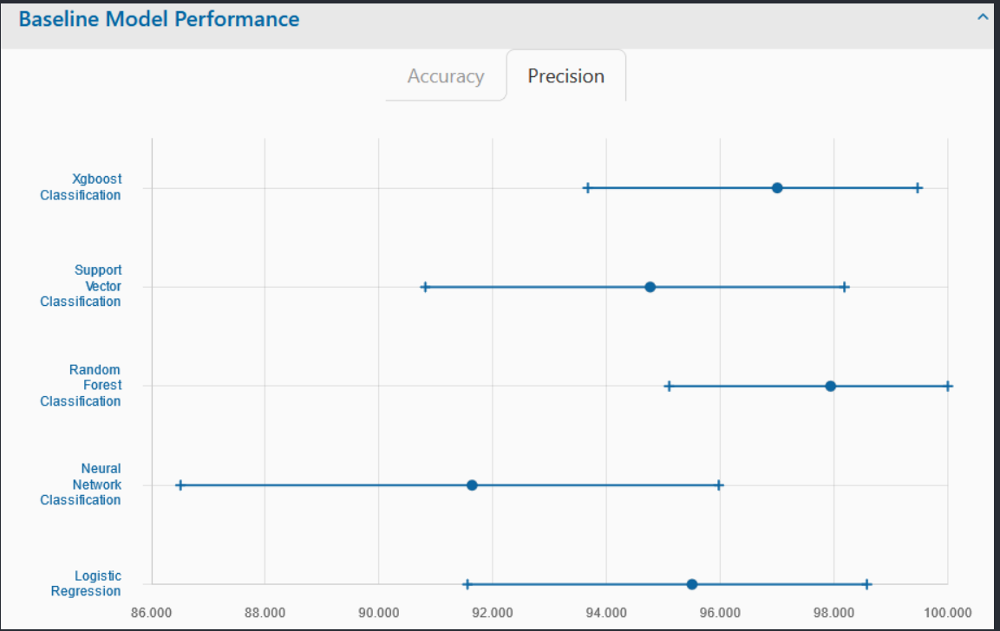

Pregunta: Cómo se comparan las características de los tumores benignos más cercanos a la frontera de clasificación con los tumores malignos?. Es decir, analizar los casos que son más difíciles de clasificar, aquellos que están cerca de la frontera de decisión de un clasificador. 

In [376]:
# Prepara los datos
X = df[['mean radius', 'mean concavity', 'worst radius', 'worst concavity', 'worst concave points']]
y = df['target']

# Divide los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [377]:
# Entrena un modelo de regresion logistica
model = LogisticRegression(max_iter=1000)
model.fit(X_train,y_train)

LogisticRegression(max_iter=1000)

In [378]:
# Obtiene las probabilidades de clasificacion para las muestras de prueba
probabilities = model.predict_proba(X_test)[:, 1]  # Probabilidad de la clase 'M'

In [379]:
# Determina la distancia de las probabilidades al umbral 0.5
distance_to_boundary = np.abs(probabilities - 0.5)

In [380]:
# Crea un DataFrame para analizar los casos cercanos a la frontera
results = X_test.copy()
results['probability_M'] = probabilities
results['true_label'] = y_test.values
results['distance_to_boundary'] = distance_to_boundary
results['predicted_label'] = model.predict(X_test)

In [381]:
# Filtra los tumores benignos y malignos mas cercanos a la frontera
benign_near_boundary = results[(results['true_label'] == 0) & (results['distance_to_boundary'] < 0.1)]
malignant_near_boundary = results[(results['true_label'] == 1) & (results['distance_to_boundary'] < 0.1)]

In [382]:
from tabulate import tabulate

In [383]:
# Imprime la tabla en formato legible
print(tabulate(benign_near_boundary.describe(), headers='keys', tablefmt='pretty', showindex=True))

+-------+--------------------+---------------------+--------------------+---------------------+----------------------+---------------------+------------+----------------------+--------------------+
|       |    mean radius     |   mean concavity    |    worst radius    |   worst concavity   | worst concave points |    probability_M    | true_label | distance_to_boundary |  predicted_label   |
+-------+--------------------+---------------------+--------------------+---------------------+----------------------+---------------------+------------+----------------------+--------------------+
| count |        3.0         |         3.0         |        3.0         |         3.0         |         3.0          |         3.0         |    3.0     |         3.0          |        3.0         |
| mean  | 14.566666666666668 |       0.12803       |       16.55        | 0.38609999999999994 | 0.15596666666666667  | 0.4687008142008347  |    0.0     | 0.05708211103631433  | 0.3333333333333333 |
|  std  | 

In [384]:
# Imprime la tabla en formato legible
print(tabulate(malignant_near_boundary.describe(), headers='keys', tablefmt='pretty', showindex=True))

+-------+-------------+----------------+--------------+-----------------+----------------------+-------------------+------------+----------------------+-----------------+
|       | mean radius | mean concavity | worst radius | worst concavity | worst concave points |   probability_M   | true_label | distance_to_boundary | predicted_label |
+-------+-------------+----------------+--------------+-----------------+----------------------+-------------------+------------+----------------------+-----------------+
| count |     1.0     |      1.0       |     1.0      |       1.0       |         1.0          |        1.0        |    1.0     |         1.0          |       1.0       |
| mean  |    13.34    |     0.1169     |    15.53     |     0.4858      |        0.1708        | 0.523896105390464 |    1.0     | 0.02389610539046405  |       1.0       |
|  std  |     nan     |      nan       |     nan      |       nan       |         nan          |        nan        |    nan     |         nan    

Variación porcentual de estadísticos al pasar de un diagnóstico benigno a maligno:

|estadístico|radio_mean|concavity_mean|radio_worst|concavity_worst|concave_points_worst|
|-----------|----------|--------------|-----------|---------------|--------------------|
|mean       |  +9.2    |    +9.5      |   +6.7    |     -20.5     |      -8.7          |
|min        |  +1.1    |    -16.3     |    0.0    |     -34.9     |      -38.7         |
|50%        |  +4.7    |    -9.1      |   +5.5    |     -31.2     |      -20.0         |
|max        |  +22.0   |    +54.9     |   +14.2   |     +3.5      |      +32.2         |

Observaciones: 

A partir de estos resultados, parece que los extremos presentan las mayores variaciones. En el caso de extrmos máximos, las características muestran los mayores aumentos porcentuales en todas las características.

Por otro lado, los extremos mínimos de 'concavity_mean', 'concavity_worst' y 'concave_points_worst' muestran una disminución porcentual significativa.

Por último, en los casos de 'concavity_worst' y 'concave_points_worst' la disminución en la mediana también parece ser un estadístico que ayude a disernir el diagnóstico en los casos de frontera.

Pregunta: Cómo varía la precisión del modelo con diferentes tamaños de muestra?. Es decir, analizar la curva de aprendizaje para ver cómo el tamaño del conjunto de entrenamiento afecta la precisión del modelo.

In [385]:
# Importa las clases necesarias
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split, learning_curve

In [386]:
# Convierte el objetivo a valores numericos
y = df['target']

In [387]:
# Genera la curva de aprendizaje
train_sizes, train_scores, test_scores = learning_curve(
    LogisticRegression(max_iter=1000), X_train, y_train, cv=5, 
    train_sizes=np.linspace(0.1, 1.0, 10), scoring='accuracy'
)

In [388]:
# Calcula las medias y desviaciones estandar para las precisiones
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

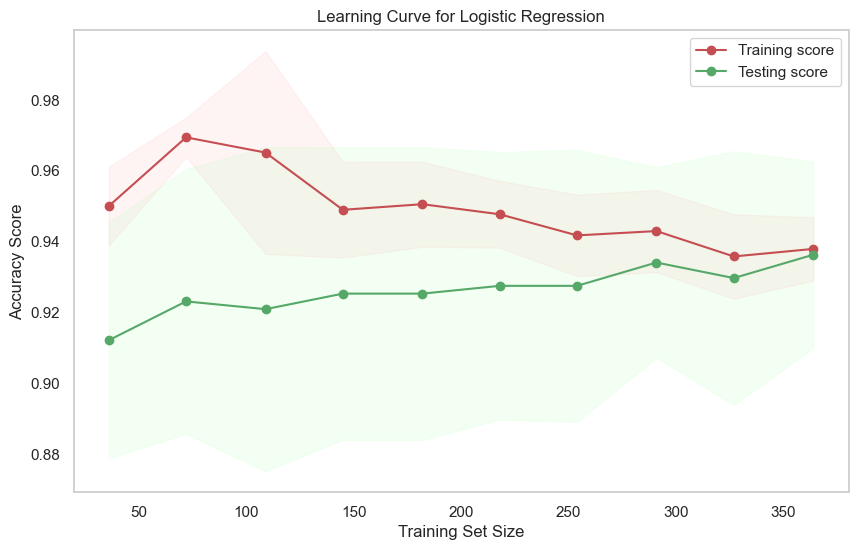

In [389]:
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_mean, 'o-', color="g", label="Testing score")

plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, color="#FF9999", alpha=0.1)
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, color="#99FF99", alpha=0.1)

plt.title("Learning Curve for Logistic Regression")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy Score")
plt.legend(loc="best")
plt.grid()
plt.show()

Observaciones: Este gráfico muestra como la precisión del modelo varía según el tamaño del conjunto de entrenamiento. Aquí algunos puntos clave que podrías observar:

En tamaños pequeños de entrenamiento, como la precisión media de entrenamiento es alta pero la de evaluación es baja, el modelo podría estar sobreajustando para esos casos.
Se observó cierta convergencia, es decir las curvas medias de entrenamiento y evaluación se acercan a medida que aumenta el tamaño del conjunto de entrenamiento, el modelo generalización.

Por otro lado, hay una disminución progresiva del desvío estándar de la precisión del conjunto de prueba, esto se debe a que cada una de las evaluaciones en los folds de la validación cruzada ve performance diferentes que al aumentar el tamaño de la muestra an convergiendo. Esto apoya la idea de que el modelo adopta la capacidad de generalizar independientemente del conjunto de datos.

Bibliografía:

Isabelle Guyon, Andre Elisseeff (2003). An introduction to variable and feature selection. Journal of Machine Learning Research 3 (2003) 1157-1182


Wolberg,William, Mangasarian,Olvi, Street,Nick, and Street,W.. (1995). Breast Cancer Wisconsin (Diagnostic). UCI Machine Learning Repository. https://doi.org/10.24432/C5DW2B.


W. Street, W. Wolberg, O. Mangasarian. (1992)
Nuclear feature extraction for breast tumor diagnosis.
Published in Electronic imaging.